# Analyse des résiliations de contrat de cartes de crédit

## Introduction

Dans le scénario idéal pour elles, les banques et les compagnies de carte de crédit arriveraient à conserver toute leur clientèle actuelle en plus d'augmenter leur part de marché. Toutefois, la compétition est forte entre les différentes institutions, qui doivent constamment se renouveler afin de rendre leurs produits attrayants. De plus, d'autres facteurs, importants mais hors de leur contrôle, peuvent pousser un client à résilier son contrat.

Le base de données utilisée ici concerne une banque dont le taux de désertion de sa clientèle au niveau des cartes de crédit a atteint environ 16% pour une année donnée (soit près d'un client sur six). Naturellement, la banque se pose les questions suivantes :

- Quels sont les principaux facteurs faisant en sorte qu'un client résilie son contrat ? À partir des données, peut-on dégager un *profil type* du client perdu ?

- Peut-on, à partir d'un ensemble de variables explicatives, prédire avec fiabilité si un client a l'intention de résilier son contrat ?

Dans ce Notebook, nous tenterons de répondre à ces questions, qui sont directement liées à la croissance ainsi qu'à la rentabilité de cette banque. Dans la [Partie 1](#scrollTo=liRuEZwcSH3U&line=3&uniqifier=1), on effectue la préparation et l'analyse des données. La [Partie 2](#scrollTo=xi8NHAWVUSP9) est consacrée à l'entraînement et l'optimisation de classificateurs dichotomiques, tandis que la [Partie 3](#scrollTo=QWxODIUDova9&line=13&uniqifier=1) adopte une autre approche, soit celle d'un modèle de prédiction du risque. On y aborde certains aspects importants comme la calibration des probabilités.

## Mise en place du Notebook

Connexion à Google Drive, installation de versions spécifiques pour certaines bibliothèques, importation et reproductibilité.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#!pip show scikit-learn
# On veut la version 1.3 minimum en raison de certaines options utilisées vers la fin de ce notebook.

In [ ]:
!pip install scikit-learn==1.3.2
!pip install imbalanced-learn==0.11.0
!pip install feature_engine
!pip install seaborn==0.13.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 48.9 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.6/235.6 kB 3.7 MB/s eta 0:00:00
  Attempting uninstall: imbalanced-learn
    Found existing installation: imbalanced-learn 0.10.1
    Uninstalling imbalanced-learn-0.10.1:
      Successfully uninstalled imbalanced-learn-0.10.1
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 328.9/328.9 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 5.2 MB/s eta 0:00:00
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.12.2
    Uninstalling seaborn-0.12.2:
      Successfully uninstalled seaborn-0.12.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the 

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(color_codes=True)
%matplotlib inline

from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV, GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, average_precision_score, auc
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score, RocCurveDisplay, PrecisionRecallDisplay, precision_recall_curve

from sklearn.ensemble import IsolationForest
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, KNNImputer
from sklearn.neighbors import LocalOutlierFactor
from feature_engine.outliers import Winsorizer

from sklearn.preprocessing import StandardScaler, QuantileTransformer
from imblearn.over_sampling import SMOTE, RandomOverSampler, SMOTENC
from imblearn.under_sampling import RandomUnderSampler, NearMiss

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from imblearn.pipeline import make_pipeline
from sklearn.feature_selection import RFECV

import warnings
warnings.filterwarnings("ignore")

# Pour la reproductibilité des résultats
np.random.seed(7)

## Partie I : préparation et analyse des données

Dans cette partie, on effectue les étapes suivantes : importation et nettoyage de la base de données, traitement des valeurs manquantes, traitement des valeurs aberrantes, transformation des variables au besoin et élimination des variables fortement corrélées entre elles. On en profite également pour faire une analyse exploratoire au fur et à mesure.

### Nettoyage préliminaire de la base de données

In [ ]:
dir = '/content/drive/MyDrive/Colab Notebooks/Projets/CreditCardChurn/BankChurners.csv'
# dir = '/kaggle/input/credit-card-customers/BankChurners.csv'
data = pd.read_csv(dir)

In [ ]:
data.shape

(10127, 23)

In [ ]:
data.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],
      dtype='object')

On supprime les deux colonnes nommées "Naive bayes classifier", puisqu'il s'agit fort probablement de tentatives antérieures cherchant à prédire l'attrition de la clientèle. On développera nos propres modèles !

In [ ]:
data = data.drop(data.columns[-2:], axis=1)

In [ ]:
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [ ]:
data['CLIENTNUM'].nunique()

10127

La colonne CLIENTNUM correspond à un identifiant unique pour le client détenant la carte de crédit. On l'enlève également, puisque cette information est superflue pour l'analyse. En outre, comme il y a 10 127 numéros différents (soit le nombre d'entrées), on peut penser qu'aucun client ne revient plus qu'une fois dans la base de données. Il reste 19 variables explicatives et une variable dépendante : 'Attrition_Flag'.

In [ ]:
data = data.drop(['CLIENTNUM'], axis=1)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

In [ ]:
data.isna().sum().max()

0

La méthode data.info() indiquait qu'il n'y avait aucune valeur de type NaN dans la base de données, et la commande en-dessous le confirme.

Par ailleurs, les colonnes "Credit_Limit", "Total_Revolving_Bal" et "Avg_Open_To_Buy" sont directement liées, la limite de crédit se décomposant systématiquement en deux parties : le solde mensuel moyen et le crédit mensuel moyen disponible. On va s'assurer que la corrélation linéaire est bel et bien très forte, puis enlever l'une des colonnes. Cette opération est pertinente, puisque de nombreux modèles sont sensibles aux variables fortement corrélées.

In [ ]:
df = data.copy(deep=True)

In [ ]:
# On profite de la vectorisation des opérations dans les dataframes & arrays.
Somme = df['Total_Revolving_Bal'] + df['Avg_Open_To_Buy']
Somme.equals(df['Credit_Limit'])

True

In [ ]:
mask = ['Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy']
df[mask].corr()

,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy
Credit_Limit,1.000000,0.042493,0.995981
Total_Revolving_Bal,0.042493,1.000000,-0.047167
Avg_Open_To_Buy,0.995981,-0.047167,1.000000


Comme la variable 'Avg_Open_To_Buy' est presque parfaitement corrélée avec 'Credit_Limit', c'est elle qu'on enlève du dataframe.

N.B. : D'autres variables semblent fortement corrélées, en raison de leur définition. C'est le cas notamment de 'Avg_Utilization_Ratio' qui, selon sa définition, s'obtient en divisant 'Total_Revolving_Bal' par 'Credit_Limit'. On s'occupera toutefois des autres corrélations plus tard.

In [ ]:
ratio = round(df['Total_Revolving_Bal'] / df['Credit_Limit'], 3)
ratio.equals(df['Avg_Utilization_Ratio'])

True

In [ ]:
df = df.drop(['Avg_Open_To_Buy'], axis=1)

In [ ]:
df.min()

Attrition_Flag              Attrited Customer
Customer_Age                               26
Gender                                      F
Dependent_count                             0
Education_Level                       College
Marital_Status                       Divorced
Income_Category                       $120K +
Card_Category                            Blue
Months_on_book                             13
Total_Relationship_Count                    1
Months_Inactive_12_mon                      0
Contacts_Count_12_mon                       0
Credit_Limit                           1438.3
Total_Revolving_Bal                         0
Total_Amt_Chng_Q4_Q1                      0.0
Total_Trans_Amt                           510
Total_Trans_Ct                             10
Total_Ct_Chng_Q4_Q1                       0.0
Avg_Utilization_Ratio                     0.0
dtype: object

In [ ]:
# On sélectionne les variables quantitatives dont le minimum est de zéro afin de savoir combien de clients ont cette caractéristique égale à zéro.
cols = df.min()[df.min() == 0].index.to_list()
liste = []
for col in cols:
  liste.append(df[df[col] == 0].shape[0])

pd.Series(data=liste, index=cols)

Dependent_count            904
Months_Inactive_12_mon      29
Contacts_Count_12_mon      399
Total_Revolving_Bal       2470
Total_Amt_Chng_Q4_Q1         5
Total_Ct_Chng_Q4_Q1          7
Avg_Utilization_Ratio     2470
dtype: int64

Comme on peut le constater, un grand nombre d'individus ont une ou plusieurs caractéristiques étudiées égales à zéro. Comme les valeurs nulles sont cohérentes et vraisemblables compte tenu du contexte, on conclut qu'il ne manque aucune valeur dans ces colonnes du dataframe.

In [ ]:
doublons = df[df.duplicated(keep='first')]

print('Nombre de valeurs dupliquées : %d' % (len(doublons)))

Nombre de valeurs dupliquées : 0


Bonne nouvelle : il n'y a aucun doublon dans la base de données. Chaque ligne du dataframe correspond donc à une personne différente, comme l'avait suggéré la colonne CLIENTNUM.

### Imputation des données manquantes, analyse et encodage des variables qualitatives

Regardons maintenant du côté des variables qualitatives. Quelles sont leurs modalités ?

In [ ]:
var_quali = df.select_dtypes(include=['object']).columns.to_list()

dict_modalites = {}
for var in var_quali:
  modalites = df[var].value_counts().index.to_list()
  dict_modalites[var] = modalites

pd.set_option('display.max_colwidth', 0) # Pour afficher chaque ligne au complet
pd.Series(data=dict_modalites)

Attrition_Flag     [Existing Customer, Attrited Customer]                                         
Gender             [F, M]                                                                         
Education_Level    [Graduate, High School, Unknown, Uneducated, College, Post-Graduate, Doctorate]
Marital_Status     [Married, Single, Unknown, Divorced]                                           
Income_Category    [Less than $40K, $40K - $60K, $80K - $120K, $60K - $80K, Unknown, $120K +]     
Card_Category      [Blue, Silver, Gold, Platinum]                                                 
dtype: object

On remarque la présence d'une modalité 'Unknown' pour trois variables. Il y a donc des attributs manquants pour certains individus dans notre base de données. Y en a-t-il beaucoup dans cette situation ?

In [ ]:
mask = (df['Education_Level'] == 'Unknown') | (df['Marital_Status'] == 'Unknown') | (df['Income_Category'] == 'Unknown')

print("Individus avec au moins un attribut 'Unknown' : {} sur {}, ou {}%".format(
    df[mask].shape[0],
    df.shape[0],
    round((df[mask].shape[0] / df.shape[0]) * 100, 3)
))

Individus avec au moins un attribut 'Unknown' : 3046 sur 10127, ou 30.078%


La proportion de données manquantes est trop importante pour qu'on supprime simplement les entrées affectées. Dans ce qui suit, nous allons explorer les données afin de voir si on peut déceler un lien entre les entrées manquantes et le *churn*, puis tester diverses stratégies d'imputation si nécessaire.

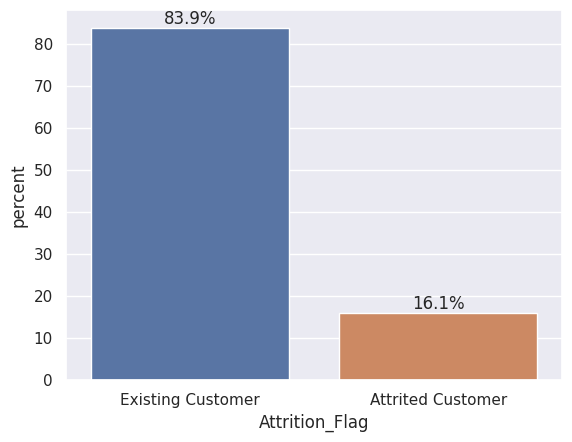

In [ ]:
ax = sns.countplot(data=df, x="Attrition_Flag", stat='percent', palette=sns.color_palette()[0:2])
for i in range(0,2):
  ax.bar_label(ax.containers[i], fmt='%.1f%%')
plt.show()
# quelques palettes de couleur disponibles ici : https://seaborn.pydata.org/generated/seaborn.color_palette.html#seaborn.color_palette
# ou encore palette=[liste de couleurs individuelles]

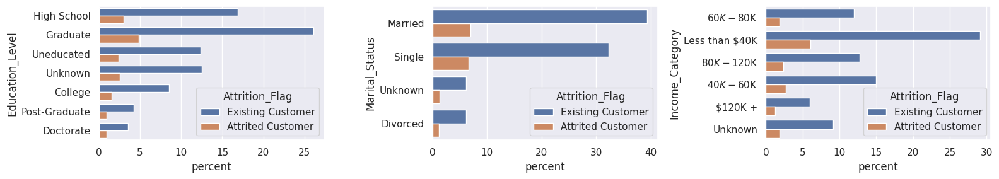

In [ ]:
vars_unknown = ['Education_Level', 'Marital_Status', 'Income_Category']

fig, axes = plt.subplots(1, 3, figsize=(16, 3))

for ax, var in zip(axes.flat, vars_unknown):
    sns.countplot(data=df, ax=ax, y = var, stat="percent", hue='Attrition_Flag')
plt.tight_layout()

Pour chaque catégorie de chaque variable, la proportion d'individus de la BD ayant résilié ou pas leur contrat est semblable à la proportion globale, qui est d'environ 16,1%.



Proportion de valeurs manquantes dans la colonne Education_Level : 14.9995%
Proportion de valeurs manquantes dans la colonne Marital_Status : 7.3961%
Proportion de valeurs manquantes dans la colonne Income_Category : 10.9805%


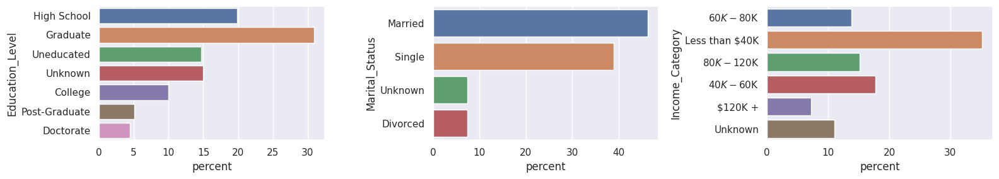

In [ ]:
vars_unknown = ['Education_Level', 'Marital_Status', 'Income_Category']

fig, axes = plt.subplots(1, 3, figsize=(16, 3))

for ax, var in zip(axes.flat, vars_unknown):
    sns.countplot(data=df, ax=ax, y=var, stat="percent", palette=sns.color_palette())
plt.tight_layout()

for var in vars_unknown:
  print("Proportion de valeurs manquantes dans la colonne {} : {}%".format(
      var,
      round((df[df[var] == 'Unknown'].shape[0] / df.shape[0]) * 100, 4)
      ))

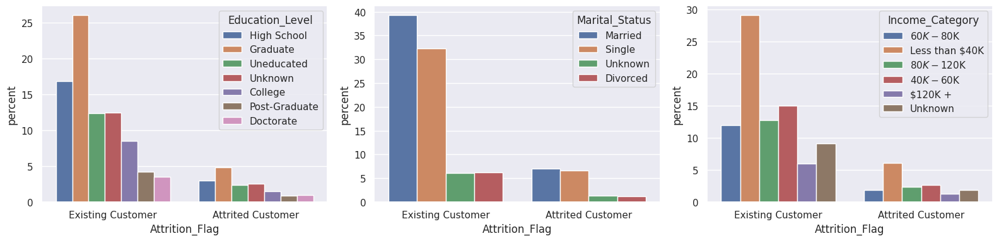

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(16, 4))

for ax, var in zip(axes.flat, vars_unknown):
    sns.countplot(data=df, ax=ax, x='Attrition_Flag', stat="percent", hue=var)
plt.tight_layout()

Quand on étudie séparément les deux types de clients (contrat actif ou résilié), les proportions d'individus dans chacune des catégories des variables Education_Level, Marital_Status et Income_Category sont très similaires aux proportions globales pour ces variables.

Mises ensemble, les dix dernières visualisations suggèrent que les trois variables Education_Level, Marital_Status et Income_Category n'ont pas beaucoup d'incidence sur le *churn*. En particulier, cela est vrai pour les individus ayant au moins une caractéristique inconnue ; cela rend peu pertinente l'utilisation de techniques complexes d'imputation des données manquantes, puisqu'on peut s'attendre à ce que leur effet sur la performance des classificateurs soit limité par la contribution non substantielle de la variable en question. En outre, certaines techniques d'imputation nécéssitent beaucoup de ressources (temps de calcul).

D'autre part, étant donné le nombre de modalités (catégories) des variables touchées et la quantité importante d'observations pour chacune d'elles, il est déconseillé de procéder à une imputation à l'aide du mode en raison du risque de sur-représentation/sous-représentation des catégories. Il reste les techniques d'imputation aléatoires basées sur la distribution des valeurs connues, mais le risque d'introduction d'un biais est également présent. Bref, compte tenu des faibles bénéfices anticipés, rien n'indique que ça en vaille la peine pour le moment.

Pour ces raisons, on utilise directement un encodeur nominal pour les variables Marital_Status et Gender, ainsi qu'un encodeur ordinal pour les variables qualitatives ordinales. Pour ces dernières, la catégorie 'Unknown' sera codée à zéro, ce qui permet une imputation cohérente avec la nature des variables. Au besoin, on pourra explorer différentes techniques d'imputation (kNN, MICE, etc.) si les performances des classificateurs sont globalement insatisfaisantes.

**N. B. :** une fois à l'étape de sélection du modèle optimal, il est important de procéder à l'imputation *après* avoir séparé le jeu de données en ensemble d'entraînement et de test, et en se basant uniquement sur les caractéristiques des données d'entraînement. Autrement, certaines caractéristiques de l'ensemble de test seront utilisées pour imputer les données manquantes (*data leakage*), ce qui améliorera artificiellement la performance en test des modèles.



In [ ]:
# Avant de poursuivre, on répertorie les variables qualitatives et les variables quantitatives.
var_quali = df.select_dtypes(include=['object']).columns.to_list()
var_quanti = df.select_dtypes(include=['int64', 'float64']).columns.to_list()

In [ ]:
df_encoded = df.copy()

# Encodage de la variable à prédire
df_encoded['Attrition_Flag'] = df_encoded['Attrition_Flag'].map({'Existing Customer': 0, 'Attrited Customer': 1})

In [ ]:
# Encodage des variables qualitatives nominales.
# Pour les modèles à ensemble ou basés sur les arbres, il est souvent plus approprié d'utiliser un encodage ordinal
# en raison des particularités propres à la génération des arbres. Ici, on émet l'hypothèse que l'effet sur la performance
# sera limité à cause du faible impact des variables qualitatives sur le churn.
variables = ['Marital_Status', 'Gender']

df_temp = df_encoded[variables].copy()
df_temp = pd.get_dummies(df_temp, prefix={'Marital_Status':'Marital_Status', 'Gender':'Gender'})
df_temp.drop(columns=['Marital_Status_Unknown', 'Gender_M'], inplace=True)

df_encoded = pd.concat([df_encoded.drop(columns=variables), df_temp], axis=1)

In [ ]:
# Encodage des variables qualitatives ordinales

vars_ordinales = ['Education_Level', 'Income_Category', 'Card_Category']

edu_levels = ["Unknown", "Uneducated", "High School", "College", "Graduate", "Post-Graduate", "Doctorate"]
income_cats = ["Unknown", "Less than $40K", "$40K - $60K", "$80K - $120K", "$60K - $80K", "$120K +"]
card_cats = ["Blue", "Silver", "Gold", "Platinum"]

vars_categories = [edu_levels, income_cats, card_cats]

for var, categories in zip(vars_ordinales, vars_categories):
  dict_mapping = {}
  for k, categorie in enumerate(categories):
    dict_mapping[categorie] = k

  df_encoded[var] = df_encoded[var].map(dict_mapping)

Note : il arrive parfois qu'on teste les performances d'un classifcateur sur le jeu de données duquel on a supprimé les variables qualitatives et/ou les lignes contenant des observations manquantes. J'ai choisi de ne pas procéder ainsi puisque j'aimerais garder un maximum d'informations pour l'instant.

### Établissement d'un modèle de base (*baseline*)

Il faut maintenant s'occuper des variables quantitatives. Plus loin, nous allons examiner plusieurs façons de traiter les valeurs aberrantes, de transformer ou pas certaines variables et de s'occuper des variables fortement corrélées. On développe donc deux modèles de base afin de comparer adéquatement leurs performances après chaque essai dans une optique de préparer le jeu de données permettant d'obtenir la meilleure performance. (Les classificateurs en question ne sont pas si importants, il suffit qu'ils soient performants.) Ici, on choisit un modèle ensembliste généralement performant (RandomForest) ainsi qu'un modèle de régression logistique, appartenant à la grande famille des modèles linéaires généralisés.

**N.B. :** pour la régression logistique, l'approche consistant à standardiser l'ensemble du jeu de données, *et ensuite* séparer celui-ci en parties entraînement/validation favorise le surapprentissage en raison des données de test utilisées pour standardiser (*data leakage*). Toutefois, comme l'objectif ici est uniquement de vérifier si les techniques essayées plus loin améliorent la performance des classificateurs, on met cette préoccupation de côté. Des moyens adéquats seront pris lors de la sélection/optimisation du modèle optimal pour prévenir cette problématique.

In [ ]:
def performances(data, metrique, n_plis):
    """
    Fonction implémentant le développement d'un modèle jusqu'à son évaluation à l'aide d'une métrique en validation croisée à n plis.
    Les classificateurs de base utilisés sont LogisticRegression() et RandomForestClassifier().

    data : Un DataFrame contenant les données. Une variable dépendante ('Attrition_Flag'), plusieurs indépendantes.

    metrique : métrique à utiliser pour évaluer la performance du modèle.

    n_plis : nombre de plis de la validation croisée (k fold).
    """
    dataframe = data.copy()

    # Séparation des noms de variables en entrées et en sortie
    Xcol = dataframe.drop(['Attrition_Flag'], axis=1).columns.to_list()
    Ycol = 'Attrition_Flag'

    # Séparation des variables en entrées X et en sortie Y
    X = dataframe[Xcol]
    y = dataframe[Ycol]

    # Standardisation des données
    scaler = StandardScaler()
    X_s = scaler.fit_transform(X)

    # Entraînement des classificateurs et calcul de la métrique d'évaluation
    clfs = [RandomForestClassifier(), LogisticRegression(penalty='l2', class_weight='balanced', solver='sag')]

    for clf in clfs:
      score = cross_val_score(clf, X_s, y, cv=n_plis, scoring=metrique, n_jobs=-1).mean()
      print("Estimation {} (n = {}, CV à {} plis) : {} de {} %".format(clf, len(X_s), str(n_plis), metrique, round(100*score, 2)))

La métrique de performance utilisée est le rappel (*recall*), car dans le contexte, il est important d'identifier correctement les clients qui pourraient résilier leur contrat.

In [ ]:
performances(df_encoded, "recall", 10)

Estimation RandomForestClassifier() (n = 10127, CV à 10 plis) : recall de 76.69 %

Estimation LogisticRegression(class_weight='balanced', solver='sag') (n = 10127, CV à 10 plis) : recall de 85.48 %


On cherchera donc à améliorer ces performances préliminaires de RandomForest et LogisticRegression donnant respectivement un rappel de 76,99% et 85,48%.



### Analyse des variables quantitatives et traitement des valeurs aberrantes

On calcule maintenant certaines statistiques propres aux variables quantitatives.

In [ ]:
df_encoded[var_quanti].describe().T

,count,mean,std,min,25%,50%,75%,max
Customer_Age,10127.0,46.325960,8.016814,26.0,41.000,46.000,52.000,73.000
Dependent_count,10127.0,2.346203,1.298908,0.0,1.000,2.000,3.000,5.000
Months_on_book,10127.0,35.928409,7.986416,13.0,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.0,3.812580,1.554408,1.0,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.0,2.341167,1.010622,0.0,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.0,2.455317,1.106225,0.0,2.000,2.000,3.000,6.000
Credit_Limit,10127.0,8631.953698,9088.776650,1438.3,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.0,1162.814061,814.987335,0.0,359.000,1276.000,1784.000,2517.000
Total_Amt_Chng_Q4_Q1,10127.0,0.759941,0.219207,0.0,0.631,0.736,0.859,3.397
Total_Trans_Amt,10127.0,4404.086304,3397.129254,510.0,2155.500,3899.000,4741.000,18484.000


Grâce aux mesures de tendance centrale, de dispersion et de position, on peut déjà constater que certaines variables prennent des valeurs très dispersées (hétérogénéité) et/ou que quelques unes ont des distributions plutôt asymétriques. C'est le cas notamment de Credit_Limit, Total_Trans_Amt et Avg_Utilization_Ratio. Affichons les distributions de toutes les variables afin de les examiner plus en détail.

<Axes: xlabel='Credit_Limit', ylabel='Count'>

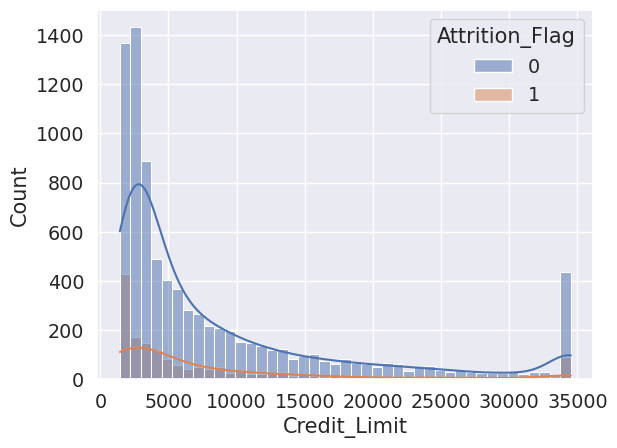

In [ ]:
sns.histplot(data = df_encoded, x='Credit_Limit', kde=True, hue='Attrition_Flag')
# Un exemple de graphique ayant une présentation soignée se trouve un peu plus loin.

In [ ]:
# Création d'un filtre pour sélectionner les individus ayant la limite de crédit minimale ET ayant résilié leur contrat
mask_creditmin_attrited = (df_encoded['Credit_Limit']==df_encoded['Credit_Limit'].min()) & (df_encoded['Attrition_Flag']==1)

# Création d'un filtre pour sélectionner les individus ayant la limite de crédit minimale
mask_creditmin = (df_encoded['Credit_Limit']==df_encoded['Credit_Limit'].min())

# Calcul de la proportion de clients perdus parmi ceux ayant la limite de crédit minimale
df_encoded[mask_creditmin_attrited].shape[0] / df_encoded[mask_creditmin].shape[0] * 100

24.45759368836292

La distribution de la limite de crédit des clients présente une forte asymétrie positive, comme anticipé. De manière intéressante, on constate que les clients ayant résilié leur contrat sont légèrement sur-représentés parmis les clients ayant la limite de crédit minimale. En effet, 24.46% des clients ayant la limite minimale ont résilié leur contrat, tandis que le taux d'attrition global est de 16,06%.

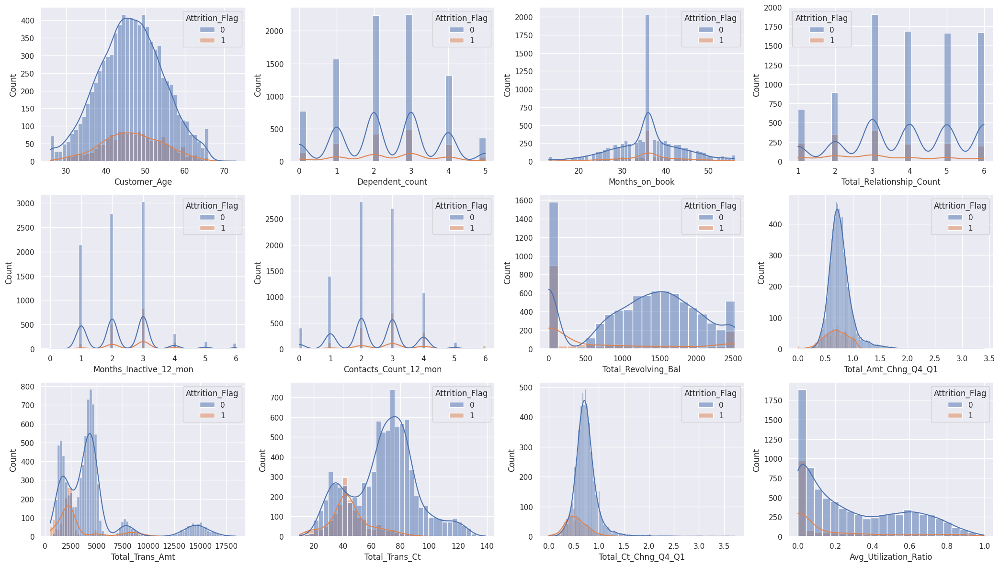

In [ ]:
# Création d'une liste contenant les 12 variables quantitatives (à l'exception de Credit_Limit)
var_quanti_sans_creditlimit = [var for var in var_quanti if var != 'Credit_Limit']

fig, axes = plt.subplots(3, 4, figsize=(21, 12))
for ax, variable in zip(axes.flat, var_quanti_sans_creditlimit):
    sns.histplot(data=df_encoded, ax=ax, x=variable, kde=True, stat="count", hue='Attrition_Flag')
plt.tight_layout()

Les graphiques contiennent de nombreuses informations révélatrices sur les variables prises en compte, notamment au niveau de leur effet sur la résiliation (ou non) du contrat, et sur la composition de la clientèle étudiée. Voici quelques éléments saillants associés aux tendances les plus nettes :

- Le plus souvent, les clients ont leur carte de crédit depuis 36 mois (Months_on_book). Il est possible que la banque ait attiré de nouveaux clients avec une promotion il y a 3 ans.

- Les clients ayant résilié leur contrat sont sur-représentés parmi ceux détenant moins de 3 produits à cette banque (Total_Relationship_Count). On observe la même tendance, mais encore plus marquée, pour les variables Total_Revolving_Bal et Avg_Utilization_Ratio. Ces observations suggèrent que les clients ayant moins de produits avec la banque, ainsi que ceux qui ne les utilisent pas beaucoup, ont plus tendance à résilier leur contrat : ils ne sont pas suffisamment *accrochés*.

- Ce constat est également visible, dans une moindre mesure, dans les distributions de certaines variables sur les deux dernières lignes. Par exemple, un nombre élevé de mois inactifs (Months_Inactive_12_mon) semble être associé avec un plus haut taux de résiliation. Le contraste est cependant frappant du côté des variables étudiant le nombre de transactions passées ainsi que leur montant (dernière ligne) : on distingue clairement que les clients ayant fermé leur compte de crédit ont fait des transactions d'un montant moins élevé, et moins souvent que les autres clients.

- Les variables étudiant le nombre de transactions passées ainsi que leur montant présentent des distributions multimodales complexes. Ces structures témoignent de la présence de plusieurs sous-groupes aux caractéristiques distinctes dans la base de données. Il pourrait être intéressant d'effectuer une analyse de regroupement afin de segmenter la clientèle, mais cela s'éloigne trop de notre objectif, qui est de prédire les résiliations de contrat.

In [ ]:
pd.crosstab(index=df['Attrition_Flag'], columns=df['Contacts_Count_12_mon'], margins=True)

Contacts_Count_12_mon,0,1,2,3,4,5,6,All
Attrition_Flag,,,,,,,,
Attrited Customer,7,108,403,681,315,59,54,1627
Existing Customer,392,1391,2824,2699,1077,117,0,8500
All,399,1499,3227,3380,1392,176,54,10127


Le tableau de contingence semble suggérer que lorsque le nombre de communications entre la banque et le client devient élevé, le client a de plus grandes chances de résilier son contrat. Il existe plusieurs tests en inférence statistique pouvant confirmer ou infirmer cette hypothèse (avec une signification et une puissance donnée), mais on se contentera d'une visualisation pour l'instant.

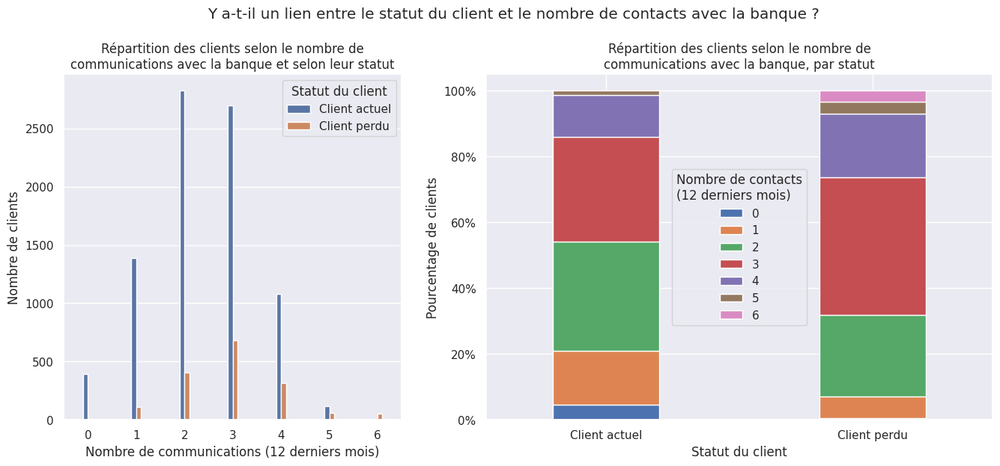

In [ ]:
# Afin de mettre une graduation en pourcentages sur le stacked barplot
import matplotlib.ticker as mtick

# Création d'un dataframe de type tableau de contingence en vue de créer un stacked barplot.
# On utilise le dataframe df plutôt que df_encoded pour avoir les catégories en mots de la variable à prédire.
# normalize='index' convertit les valeurs en pourcentage, selon chaque ligne.
idx = ['Existing Customer', 'Attrited Customer']
df_contact_attrition = pd.crosstab(index=df['Attrition_Flag'], columns=df['Contacts_Count_12_mon'], normalize='index').reindex(idx)

# Visualisation
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6), width_ratios=[2, 3])

ax1 = plt.subplot(1, 2, 1)
sns.countplot(data=df, x='Contacts_Count_12_mon', hue='Attrition_Flag', ax=ax1, width=0.2)
ax1.set_xlabel('Nombre de communications (12 derniers mois)')
ax1.set_ylabel('Nombre de clients')
ax1.legend(['Client actuel', 'Client perdu'], title='Statut du client')
ax1.set_title('Répartition des clients selon le nombre de'+'\n'+'communications avec la banque et selon leur statut')

ax2 = plt.subplot(1, 2, 2)
df_contact_attrition.plot(kind='bar', stacked=True, ax=ax2, color=sns.color_palette(), width=0.4)
ax2.tick_params(axis='x', labelrotation=0) # Texte à l'horizontal sous l'axe des x
ax2.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1, decimals=0)) # Pour formatter l'axe vertical en pourcentage
ax2.set_xlabel('Statut du client')
ax2.set_xticklabels(['Client actuel', 'Client perdu'])
ax2.set_ylabel('Pourcentage de clients')
ax2.legend(loc='center', title='Nombre de contacts'+'\n'+'(12 derniers mois)', alignment='center')
ax2.set_title('Répartition des clients selon le nombre de'+'\n'+'communications avec la banque, par statut')

plt.suptitle('Y a-t-il un lien entre le statut du client et le nombre de contacts avec la banque ?', y=1.03)
plt.show()

Ces graphiques illustrent clairement que chez les clients qui ont annulé leur contrat de carte de crédit, on observe une proportion significativement plus élevée d'individus qui ont été contactés 3 fois ou plus par la banque que pour les individus n'ayant pas résilié leur contrat.

En outre, dans ce cas-ci, les extrêmes sont intriguants. Pour cause, aucun client ayant eu zéro communication avec la banque n'a résilié son contrat, tandis que tous les clients ayant eu six contacts ont résilié leur contrat (ils sont cinquante-quatre dans cette situation). De ce constat découle naturellement la question suivante : pour quelle(s) raison(s) la banque a-t-elle communiqué plus souvent avec ces clients ? Il s'agit d'une avenue intéressante si l'on souhaite mieux comprendre le comportement de la clientèle. (Les métadonnées accompagnant cette base de données ne contiennent pas d'information quant à l'initiateur de ces appels.)

#### Élimination/transformation des valeurs aberrantes

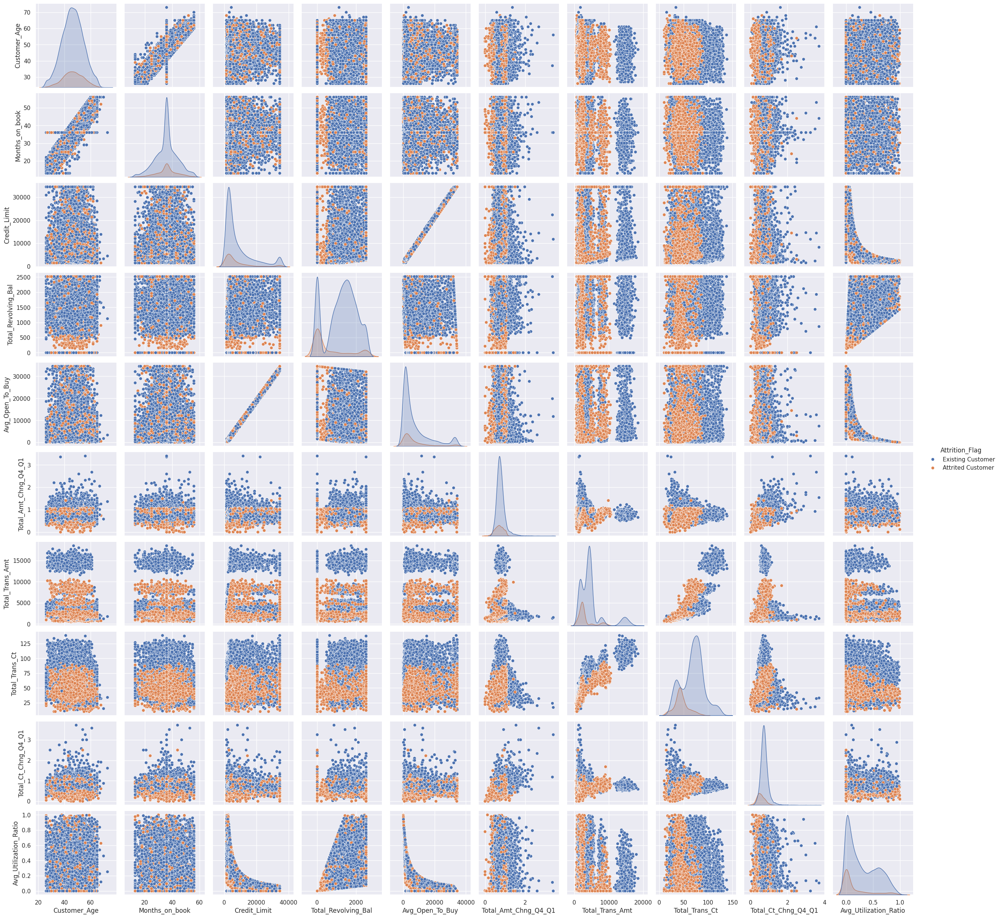

In [ ]:
# Diagrammes de dispersion par paires de variables (excluant les variables quantitatives discrètes)
sns.pairplot(data=df.drop(columns=['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']), hue='Attrition_Flag')

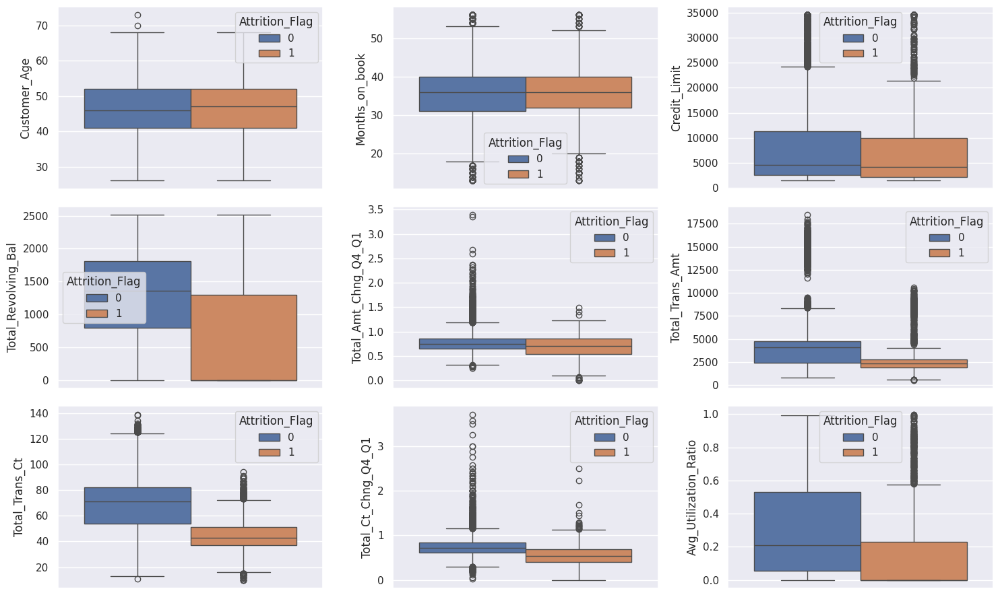

In [ ]:
vars_quanti_discretes = ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']
vars_quanti_continues = [var for var in var_quanti if var not in vars_quanti_discretes]

fig, axes = plt.subplots(3, 3, figsize=(15, 9))
for ax, variable in zip(axes.flat, vars_quanti_continues):
    sns.boxplot(data=df_encoded, ax=ax, y=variable, hue='Attrition_Flag')
plt.tight_layout()

Les diagrammes de dispersion ci-dessus font apparaître plusieurs corrélations non linéaires bien définies entre certaines variables. Par conséquent, il est possible que les modèles d'apprentissage ne faisant pas l'hypothèse de variables explicatives indépendantes (tels que les modèles à ensemble) performent mieux. On remarque que dans de nombreux cas, les clients ayant résilié leur contrat forment des sous-groupes distincts et bien visibles.

En outre, malgré ce qu'en disent les *boxplot* (qui se basent sur l'écart interquartile, surtout utile en présence de distributions normales ou au minimum symétriques), on remarque que peu de variables présentent des valeurs *réellement* aberrantes, en raison des distributions à haute dispersion et à plusieurs sous-groupes. C'est le cas notamment pour les variables Total_Ct_Chng_Q4_Q1 et Total_Amt_Chng_Q4_Q1. On peut essayer d'éliminer certaines valeurs aberrantes pour ces variables, mais il semble mal avisé d'effectuer ce genre de procédure sur les autres pour les raisons mentionnées ci-haut. On risquerait de perdre ou d'altérer de l'information utile.

On commence par essayer la méthode LocalOutlierFactor.

In [ ]:
def elimine_aberrantes_LOF(data, Xcol, n_neighbors=20):
    df2 = data.copy(deep=True)

    # Normalisation des variables d'entrées (afin de les ramener au même ordre de grandeur)
    scaler = StandardScaler()
    df2[Xcol] = scaler.fit_transform(df2[Xcol])

    # Détection des valeurs aberrantes. Cette fonction ajoute une variable outliers
    # dans le dataframe. La variable outliers vaut -1 pour les valeurs aberrantes
    # et +1 pour les autres (convention de sk-learn pour la méthode fit_predict).
    lof = LocalOutlierFactor(n_neighbors)
    df2['outliers'] = lof.fit_predict(df2[Xcol])

    # Élimination des valeurs aberrantes des données originales.
    # On conserve ainsi les variables originales, sans normalisation.
    data.drop(df2[df2.outliers < 0].index, inplace=True)

    return data

In [ ]:
vars = ['Total_Amt_Chng_Q4_Q1', 'Total_Ct_Chng_Q4_Q1']
df_encoded_LOF = df_encoded.copy()
n_actuel = df_encoded_LOF.shape[0]

df_encoded_LOF = elimine_aberrantes_LOF(df_encoded_LOF, vars, 20)

n_apres = df_encoded_LOF.shape[0]

print('Nombre de valeurs aberrantes éliminées : {} ({}%)'.format(n_actuel-n_apres, round(100*(1-n_apres/n_actuel), 2)))

Nombre de valeurs aberrantes éliminées : 70 (0.69%)


In [ ]:
performances(df_encoded_LOF, 'recall', 10)

Estimation RandomForestClassifier() (n = 10057, CV à 10 plis) : recall de 75.65 %

Estimation LogisticRegression(class_weight='balanced', solver='sag') (n = 10057, CV à 10 plis) : recall de 85.33 %


Cette première méthode n'a pas permis d'améliorer les performances des classificateurs. Comme discuté précédemment, peu de valeurs aberrantes ont été identifiées (0,69% seulement). L'impact est donc négligeable, et le résultat sera probablement le même avec la méthode IsolationForest, puisqu'elle nécessite de fournir un taux de *contamination*. Essayons avec un taux de 2%, même s'il est possible que l'algorithme ratisse trop large.

In [ ]:
def elimine_aberrantes_iF(data, Xcol, contamination):
    df2 = data.copy(deep=True)

    # Normalisation des variables d'entrée (afin de les ramener au même ordre de grandeur)
    scaler = StandardScaler()
    df2[Xcol] = scaler.fit_transform(df2[Xcol])

    # Détection des valeurs aberrantes. Cette fonction ajoute une variable outliers
    # dans le dataframe. La variable outliers vaut -1 pour les valeurs aberrantes
    # et +1 pour les autres
    i_forest = IsolationForest(contamination=contamination)
    df2['outliers'] = i_forest.fit(df2[Xcol]).predict(df2[Xcol])

    # Élimination des valeurs aberrantes des données originales.
    # On conserve ainsi les variables originales, sans normalisation.
    data.drop(df2[df2.outliers < 0].index, inplace = True)

    return data

In [ ]:
vars = ['Total_Amt_Chng_Q4_Q1', 'Total_Ct_Chng_Q4_Q1']
df_encoded_iF = df_encoded.copy()
n_actuel = df_encoded_iF.shape[0]

df_encoded_iF = elimine_aberrantes_iF(df_encoded_iF, vars, 0.02)

n_apres = df_encoded_iF.shape[0]

print('Nombre de valeurs aberrantes éliminées : {} ({}%)'.format(n_actuel-n_apres, round(100*(1-n_apres/n_actuel), 2)))

Nombre de valeurs aberrantes éliminées : 203 (2.0%)


In [ ]:
performances(df_encoded_iF, 'recall', 10)

Estimation RandomForestClassifier() (n = 9924, CV à 10 plis) : recall de 76.21 %

Estimation LogisticRegression(class_weight='balanced', solver='sag') (n = 9924, CV à 10 plis) : recall de 85.3 %


Pas d'amélioration notable, tel qu'anticipé. Une autre approche est celle de la méthode Winsorizer(). Plutôt que d'éliminer les valeurs jugées aberrantes, cette méthode les ramène à un seuil minimal et/ou maximal, spécifié par l'utilisateur. Étant donné la forte asymétrie positive des distributions en cause, on spécifiera uniquement une borne supérieure calculée à partir de la MAD, ou *median absolute deviation*, qui est une mesure robuste de la dispersion d'une série statistique. Elle ne nécessite pas que la distribution des variables s'apparente à une courbe normale pour être fiable, ce qui est un avantage comparativement à l'écart interquartile.

On utilisera cette méthode sur les variables Total_Ct_Chng_Q4_Q1, Total_Amt_Chng_Q4_Q1 et Avg_Utilization_Ratio, soit les trois variables présentant une asymétrie positive prononcée, mais sans agglomération d'observations près de la valeur maximale. Le paramètre *fold* détermine le nombre d'écarts absolus à la médiane qui sont nécessaires pour considérer une valeur comme aberrante.

In [ ]:
vars = ['Total_Amt_Chng_Q4_Q1', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']
Win = Winsorizer(capping_method='mad', tail='right', fold=3, variables=vars)
df_encoded_win = df_encoded.copy()

# Calcul des MAD pour les variables visées
Win.fit(df_encoded_win[vars])

# On affiche en nombre et en pourcentage la quantité d'observations qui seront modifiées par la procédure.
for var in vars:
  mask = (df_encoded_win[var] > Win.right_tail_caps_[var])
  nombre_valeurs = df_encoded_win[mask].shape[0]
  pourcentage_valeurs = round(nombre_valeurs / df_encoded_win.shape[0] * 100, 2)
  print('[Winsorizer] -> variable {} : {} observations réduites ({}%)'.format(var, nombre_valeurs, pourcentage_valeurs))

# Réduction des valeurs jugées aberrantes
df_encoded_win[vars] = Win.transform(df_encoded_win[vars])

[Winsorizer] -> variable Total_Amt_Chng_Q4_Q1 : 299 observations réduites (2.95%)

[Winsorizer] -> variable Total_Ct_Chng_Q4_Q1 : 229 observations réduites (2.26%)

[Winsorizer] -> variable Avg_Utilization_Ratio : 28 observations réduites (0.28%)


In [ ]:
performances(df_encoded_win, 'recall', 10)

Estimation RandomForestClassifier() (n = 10127, CV à 10 plis) : recall de 76.87 %

Estimation LogisticRegression(class_weight='balanced', solver='sag') (n = 10127, CV à 10 plis) : recall de 85.36 %


Ainsi, aucune des trois méthodes testées pour s'occuper des valeurs aberrantes n'a donné de meilleurs résultats en classification que notre *baseline*. On conclut qu'il est préférable de garder toutes les observations telles quelles.

### Transformation des variables quantitatives

Parfois, transformer la distribution de certaines variables afin de la faire ressembler davantage à une courbe normale peut améliorer les performances d'un classificateur. Ces techniques sont néanmoins déconseillées quand les distributions en question sont multimodales, et/ou qu'elles contiennent beaucoup de structure. Dans notre cas, en se fiant aux distributions affichées [ici](#scrollTo=_ym3eOs5kAsx&line=1&uniqifier=1), les variables Customer_Age,  Months_on_book, Total_Amt_Chng_Q4_Q1 et Total_Ct_Chng_Q4_Q1 ressemblent à des distributions normales (certaines en sont déjà très proches). Nous allons donc les transformer pour voir si cela améliorera les performances du classificateur. Cette opérateur est effectuée avec la méthode QuantileTransformer() du module scikit-learn.

In [ ]:
vars = ['Customer_Age', 'Months_on_book', 'Total_Amt_Chng_Q4_Q1', 'Total_Ct_Chng_Q4_Q1']
df_encoded_transform = df_encoded.copy()

QT = QuantileTransformer(output_distribution='normal')

df_encoded_transform[vars] = QT.fit_transform(df_encoded_transform[vars])

Réaffichons les histogrammes des nouvelles distributions :

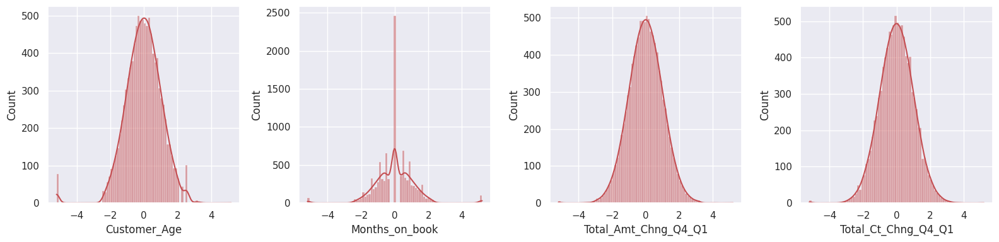

In [ ]:
vars = ['Customer_Age', 'Months_on_book', 'Total_Amt_Chng_Q4_Q1', 'Total_Ct_Chng_Q4_Q1']
fig, axes = plt.subplots(1, 4, figsize=(16,4))
for ax, var in zip(axes.flatten(), vars):
  sns.histplot(data=df_encoded_transform, x=var, ax=ax, kde=True, color='r')

plt.tight_layout()

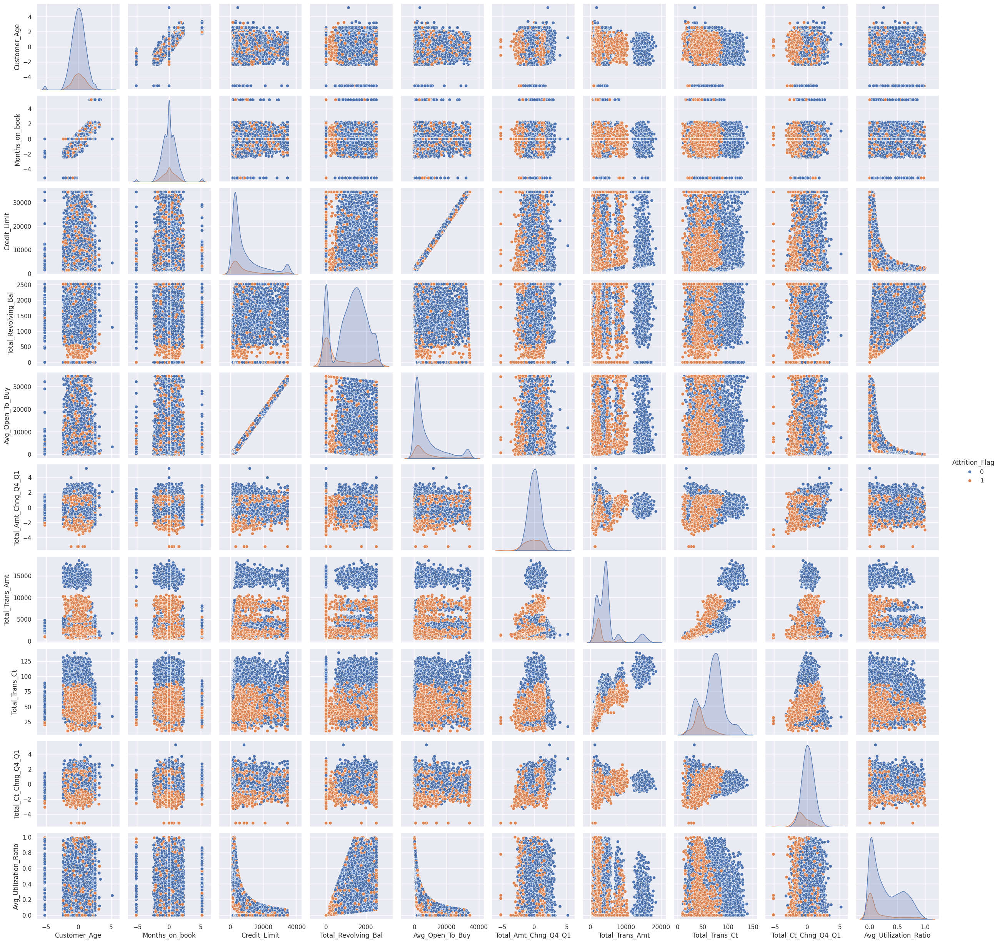

In [ ]:
cols_to_drop = ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon',
                'Education_Level', 'Income_Category', 'Card_Category', 'Marital_Status_Divorced', 'Marital_Status_Married', 'Marital_Status_Single', 'Gender_F']
sns.pairplot(df_encoded_transform.drop(columns=cols_to_drop), hue='Attrition_Flag')

In [ ]:
performances(df_encoded_transform, 'recall', 10)

Estimation RandomForestClassifier() (n = 10127, CV à 10 plis) : recall de 76.93 %

Estimation LogisticRegression(class_weight='balanced', solver='sag') (n = 10127, CV à 10 plis) : recall de 85.23 %


La performance des classificateurs de base n'a pas augmenté. Concernant les variables, on peut constater que la transformation est incomplète pour la variable Months_on_book, vraisemblablement en raison de la grande concentration des valeurs au centre. La variable Customer_Age présente également quelques problèmes de structure.

Par ailleurs, la transformation à l'aide des quantiles peut avoir comme conséquence d'altérer les corrélations entre les variables. L'effet est perceptible dans les nuages de points ci-haut à quelques endroits. Par extension, cela peut également nuire à la performance de certains types de classificateurs, car ils seront moins en mesure de détecter/modéliser les relations non linéaires entre les variables explicatives et celle de sortie. Il est difficile de voir si c'est le cas ici, puisque la variable à prédire est binaire. Pour l'instant, on conserve notre modèle de base.

---

Dans le cas des variables présentant une asymétrie positive, une autre façon de transformer leur distribution pour qu'elle suive une loi normale est de prendre le logarithme de toutes les valeurs. En effet, cela permet généralement de réduire l'écart entre les valeurs extrêmes et toutes les autres en les ramenant sur un intervalle plus compact. Nous allons tester cette dernière approche ci-dessous.

In [ ]:
vars = ['Total_Amt_Chng_Q4_Q1', 'Total_Ct_Chng_Q4_Q1']
df_encoded_log = df_encoded.copy()

df_encoded_log[vars] = df_encoded_log[vars].apply(np.log1p)

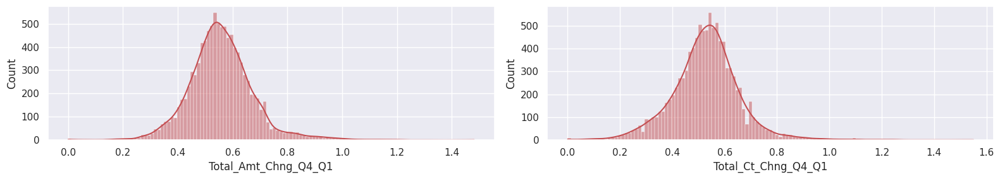

In [ ]:
# On visualise les nouvelles distributions
fig, axes = plt.subplots(1, 2, figsize=(16,3))
for ax, var in zip(axes.flatten(), vars):
  sns.histplot(data=df_encoded_log, x=var, ax=ax, kde=True, color='r')

plt.tight_layout()

In [ ]:
performances(df_encoded_log, 'recall', 10)

Estimation RandomForestClassifier() (n = 10127, CV à 10 plis) : recall de 76.38 %

Estimation LogisticRegression(class_weight='balanced', solver='sag') (n = 10127, CV à 10 plis) : recall de 85.54 %


Bien que la log-transformation ait relativement bien fonctionné, les modèles de base n'ont pas mieux performé. Comme il n'y a pas d'avantage marqué à transformer les variables de la sorte, on conserve notre modèle de base.

### Traitement des variables fortement corrélées

Commençons par afficher la matrice de corrélations linéaires associée aux variables quantitatives.

In [ ]:
# df_encoded.corr()

Il est difficile de décortiquer une matrice aussi grande, même si on peut constater que la majorité des variables ne sont pas corrélées avec les autres. Visualisons les coefficients de corrélation linéaire dans un graphique de type *heatmap* :

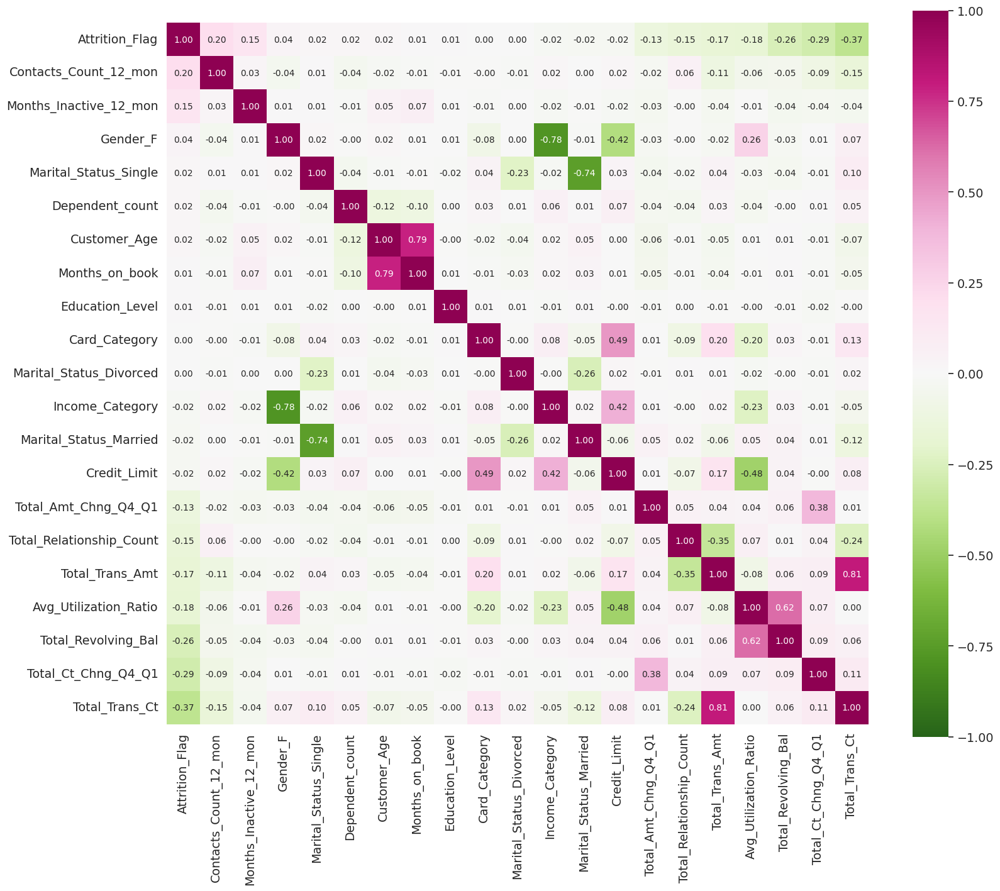

In [ ]:
# On calcule la matrice de corrélation
corr_matrix = df_encoded.corr()

# On trie les colonnes et les lignes en fonction des corrélations avec la variable à prédire
corr_matrix = corr_matrix.sort_values(by='Attrition_Flag', axis=1, ascending=False).sort_values(by='Attrition_Flag', axis=0, ascending=False)

# On crée la heatmap.
# Un gradient de couleurs divergent au centre (cmap) est idéal pour illustrer des corrélations à cause de la signification du zéro.
plt.figure(figsize=(18, 15))
sns.set(font_scale=1.25)
hm = sns.heatmap(corr_matrix, cbar=True, center=0, vmin=-1, vmax=1, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, cmap="PiYG_r")
plt.show()

# La carte thermique étant de grande taille, il est recommandé de la visualiser dans une fenêtre à part.

In [ ]:
vars_quali_encoded = ['Education_Level', 'Income_Category', 'Card_Category', 'Marital_Status_Divorced', 'Marital_Status_Married', 'Marital_Status_Single', 'Gender_F']
df_test = df_encoded.drop(columns=vars_quali_encoded)
performances(df_test, 'recall', 10)

Estimation RandomForestClassifier() (n = 10127, CV à 10 plis) : recall de 77.8 %

Estimation LogisticRegression(class_weight='balanced', solver='sag') (n = 10127, CV à 10 plis) : recall de 85.05 %


La carte thermique des corrélations renferme beaucoup d'informations intéressantes ! On résume ici les points les plus importants au regard de notre objectif. (Il faut faire attention à certaines interprétations, étant donné que certains coefficients sont calculés à partir de variables qualitatives encodées avec la méthode *one-hot*.)

- La grande majorité (environ 85%) des variables explicatives ne sont pas linéairement corrélées entre elles.

- On constate que de nombreuses variables qualitatives sont corrélées linéairement entre elles, certaines paires affichant des coefficients parmi les plus élevés. Ce constat rend légitime une tentative de supprimer toutes les variables qualitatives du jeu de données afin de voir l'impact sur la performance, ce qui a été effectué ci-haut. Verdict : aucun changement pour la régression logistique, et une faible amélioration (2 points de %) pour RandomForest.

- Parmi les coefficients de corrélation linéaire les plus élevés, on retrouve la paire Customer_Age et Months_on_book, la paire Gender_F et Income_Category, deux modalités de Marital_Status, Total_Trans_Amt et Total_Trans_Ct, ainsi que la paire Avg_Utilization_Ratio et Total_Revolving_Bal.

- La carte thermique semble valider notre hypothèse selon laquelle les variables qualitatives ont dans l'ensemble peu d'incidence sur la désertion de la clientèle : avec Attrition_Flag, leur coefficients sont près de 0. À l'inverse, toutes les variables les plus corrélées avec celle à prédire sont quantitatives.

- Le signe négatif des coefficients des variables quantitatives les plus corrélées avec Attrition_Flag tend à confirmer nos hypothèses. Quand ces variables augmentent, il s'agit de clients utilisant beaucoup leur carte de crédit, avec de grandes balances traînées de mois en mois, passant un nombre élevé de transactions, avec des montants plus élevés ; on observe alors une baisse de Attrition_Flag, et comme sa valeur est de zéro (client actuel) ou un (client perdu), on déduit qu'il s'agit de clients qui ont moins l'intention de résilier leur contrat. Ceux qui sont bien *accrochés* avec la banque ont moins tendance à partir.

- Un exemple de coefficients non représentatifs : ceux entre Avg_Utilization_Ratio ainsi que Credit_Limit et Total_Revolving_Bal. En effet, ils indiquent respectivement un lien linéaire d'intensité modérée (r = -0.48) et forte (r = 0.62). Dans les faits, ces variables sont liées par une relation non linéaire puisqu'on obtient le ratio d'utilisation en divisant la balance mensuelle totale par la limite de crédit. Le *pairplot* affiché plus haut témoigne très bien de cette relation non linéaire entre Avg_Utilization_Ratio et Credit_Limit ; c'est un bon exemple démontrant l'importance d'examiner les diagrammes de dispersion, et pas seulement les coefficients de corrélation linéaire.

---

C'est un peu arbitraire, mais on considérera le retrait d'une variable si elle présente un coefficient de corrélation au-dessus de 0.7 avec une autre variable, ou si elle est modérément corrélée avec plusieurs variables. Quand on s'occupe des variables fortement corrélées, il faut faire attention à ne pas enlever des variables qui amènent beacoup d'information quant à la variable à prédire, sous peine de nuire à la performance des modèles. Il faut donc également considérer l'apport de cette variable avant de prendre notre décision. Par conséquent :

- Vu le faible apport des variables qualitatives et la stagnation des performances des modèles sans celles-ci, on ne se donne pas la peine d'en enlever, malgré certaines corrélations significatives.

- On essaie d'enlever Total_Trans_Amt plutôt que Total_Trans_Ct, puisque cette dernière est plus fortement corrélée avec la variable à prédire. On enlève également Credit_Limit, qui semble corrélée avec plusieurs variables, et on garde Total_Revolving_Bal et Avg_Utilization_Ratio, qui sont plus fortement corrélées avec la variable à prédire. Il y a cependant un risque que les performances diminuent, puisqu'il s'agit quand même de deux variables apportant des informations non négligeables.

- Finalement, on enlève Customer_Age (mais Months_on_book aurait également été un choix possible).

In [ ]:
vars_retirees = ['Credit_Limit', 'Total_Trans_Amt', 'Customer_Age']
df_encoded_vars_retirees = df_encoded.copy()
df_encoded_vars_retirees = df_encoded_vars_retirees.drop(columns=vars_retirees)

performances(df_encoded_vars_retirees, 'recall', 10)

Estimation RandomForestClassifier() (n = 10127, CV à 10 plis) : recall de 67.02 %

Estimation LogisticRegression(class_weight='balanced', solver='sag') (n = 10127, CV à 10 plis) : recall de 80.72 %


Les performances ont diminué. On constate une diminution d'environ 10 points de pourcentage pour la forêt aléatoire, et d'environ 5 points de pourcentage pour la régression logistique. On conserve donc toutes les variables explicatives.

## Partie II : sélection et optimisation du meilleur modèle

On passe maintenant à la phase d'entraînement et d'évaluation de modèles variés. Par conséquent, les étapes suivantes seront réalisées : séparation des données en ensembles d'entraînement (incluant la validation croisée) et de test, entraînement de plusieurs modèles avec des techniques de rééchantillonnage variées, optimisation des hyperparamètres des modèles retenus, calcul et analyse des métriques d'intérêt, et finalement, analyse de l'importance relative des variables explicatives.

In [ ]:
# Séparation des variables explicatives (X) et de la variable à prédire (y)
Xcol = df_encoded.drop(['Attrition_Flag'], axis=1).columns.to_list()
Ycol = 'Attrition_Flag'

X = df_encoded[Xcol]
y = df_encoded[Ycol]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)

### Entraînement de plusieurs modèles (recherche du modèle optimal)

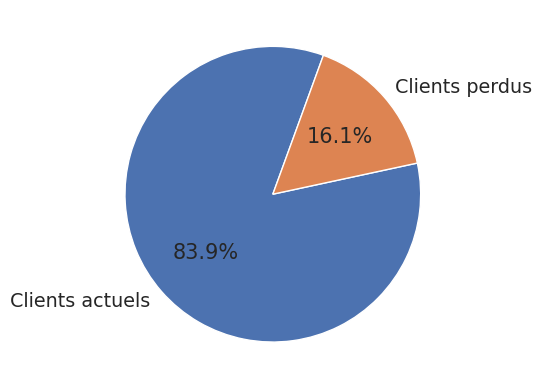

In [ ]:
labels = ['Clients actuels', 'Clients perdus']
pourcentages = [*y.value_counts()]

fig, ax = plt.subplots()
ax.pie(pourcentages, labels=labels, autopct='%1.1f%%', startangle=70)
plt.show()

In [ ]:
y.value_counts()

0    8500
1    1627
Name: Attrition_Flag, dtype: int64

Les deux classes sont présentes dans des proportions inégales d'environ 5 : 1.

On peut essayer différentes méthodes de rééchantillonnage afin d'éviter que nos modèles ne développent un biais favorable à la classe la plus répandue, même si le débalancement n'est que modéré. Toutefois, il est tout à fait possible que les méthodes de rééchantillonnage ne soient pas nécessaires, puisqu'après avoir séparé les données en ensembles d'entraînement et de test, on aura tout de même plus d'un millier d'exemples de la classe minoritaire pour l'entraînement. Il y a donc de bonnes chances que certains modèles soient en mesure de bien cerner les clients ayant résilié leur contrat, et ce, sans balancement artificiel des classes.

La cellule de code ci-dessous teste différentes combinaisons de modèles, de techniques de rééchantillonnage et de groupes de variables explicatives afin de trouver le modèle optimal. Celui ou ceux qui performeront le mieux seront ensuite optimisés au niveau de leurs hyperparamètres.

#### Recherche du modèle optimal

In [ ]:
# Création d'un dictionnaire contenant les modèles statistiques qui seront entraînés
modeles = {'Logistic Regression': LogisticRegression(solver='sag'),
          'L.R. avec poids': LogisticRegression(solver='sag', class_weight='balanced'),
          'Decision Tree': DecisionTreeClassifier(),
          'D.T. avec poids': DecisionTreeClassifier(class_weight='balanced'),
          'Random Forest': RandomForestClassifier(),
          'R.F. avec poids': RandomForestClassifier(class_weight='balanced'),
          'Gradient Boosting' : GradientBoostingClassifier(),
          'AdaBoost' : AdaBoostClassifier(),
          'Extreme Gradient Boosting' : XGBClassifier()}

# Création d'un dictionnaire contenant les techniques de rééchantillonnage (resamplers) qui seront testées
resamplers = {'Aucun': None,
              'Random Under Sampling' : RandomUnderSampler(),
              'NearMiss' : NearMiss(version=1),
              'SMOTE': SMOTE(),
              'SMOTENC': SMOTENC(categorical_features=[2, 3, 4, 16, 17, 18, 19]),
              'Random Over Sampling': RandomOverSampler()}

resultats = []

# Standardisation des données. Cette étape n'est pas essentielle pour les modèles à ensemble, mais elle recommandée
# pour la régression logistique (en raison de la régularisation), et elle est importante pour les techniques de
# rééchantillonnage basées sur les k plus proches voisins (comme SMOTE) en raison des calculs de distance entre les points.
scaler = StandardScaler()
X_train_s = scaler.fit_transform(X_train)
X_test_s = scaler.transform(X_test)

# On itère sur chaque modèle
for nom_modele, modele in modeles.items():
    # On itère sur chaque technique de rééchantillonnage
    for nom_resampler, resampler in resamplers.items():
        # Rééchantillonnage de l'ensemble d'entraînement
        if resampler == None:
          X_train_resampled, y_train_resampled = X_train_s, y_train
        else:
          X_train_resampled, y_train_resampled = resampler.fit_resample(X_train_s, y_train)

        # Sélection de variables avec la classe RFECV (Recursive Feature Elimination with CV) de sk-learn
        selector = RFECV(modele, step=1, min_features_to_select=5, cv=5)
        selector.fit(X_train_resampled, y_train_resampled)
        X_train_selected = selector.transform(X_train_resampled)

        # On entraîne le modèle à l'aide des variables sélectionnées précédemment.
        # On aurait pu inclure les étapes préparatoires (pre-processing) dans le pipeline ; ce sera fait à la phase d'optimisation des hyperparamètres.
        pipeline = make_pipeline(modele)
        pipeline.fit(X_train_selected, y_train_resampled)

        # On évalue la performance du modèle sur l'ensemble de test à l'aide de plusieurs métriques
        X_test_selected = selector.transform(X_test_s)
        y_pred = pipeline.predict(X_test_selected)
        acc = accuracy_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)

        # Enregistrement des résultats par modèle et par technique de rééchantillonnage dans une liste de dictionnaires
        resultats.append({'Modèle': nom_modele,
                        'Technique de rééchantillonnage': nom_resampler,
                        'Nombre de variables retenues' : selector.n_features_,
                        'Exactitude': acc,
                        'Score F1': f1,
                        'Précision': precision,
                        'Rappel': recall})

# On convertit les résultats en un DataFrame
resultats_df = pd.DataFrame(resultats)

In [ ]:
dir_out = '/content/drive/MyDrive/Colab Notebooks/Projets/CreditCardChurn/'
resultats_df.to_csv(dir_out + 'Résultats_df.csv', index=False)

#### Récupération des résultats enregistrés, affichage des scores maximaux

In [ ]:
dir = '/content/drive/MyDrive/Colab Notebooks/Projets/CreditCardChurn/Résultats_df.csv'
resultats_df = pd.read_csv(dir)

In [ ]:
resultats_df.iloc[:, -4:].max()

Exactitude    0.973017
Score F1      0.909890
Précision     0.932432
Rappel        0.957082
dtype: float64

Indépendamment des modèles concernés, les résultats maximaux sont satisfaisants. Par conséquent, il ne semble pas nécessaire de procéder à une imputation plus complexe des données manquantes pour les variables qualitatives.

#### Modèle, rééchantillonnage VS Nombre de variables retenues

Les graphiques ci-dessous montrent qu'il n'y a pas de tendance claire en ce qui concerne le nombre de variables retenues dans l'entraînement et le modèle utilisé / la technique de rééchantillonnage utilisée, à l'exception d'AdaBoost qui est très constant d'une technique à l'autre. Il pourrait être intéressant d'étudier *quelles* variables ont été retenues en fonction des mêmes caractéristiques. Ici, on se contentera d'analyser l'importance relative de chaque variable quand le modèle optimal aura été établi.

In [ ]:
sns.countplot(data=resultats_df, x='Nombre de variables retenues')

In [ ]:
techniques = resultats_df['Technique de rééchantillonnage'].value_counts().index.to_list()
fig, axes = plt.subplots(2, 3, figsize=(15, 9))

for tech, ax in zip(techniques, axes.flatten()):
  mask = (resultats_df['Technique de rééchantillonnage'] == tech)
  sns.countplot(data=resultats_df[mask], x='Nombre de variables retenues', ax=ax)
  ax.set_title(tech)

plt.tight_layout()

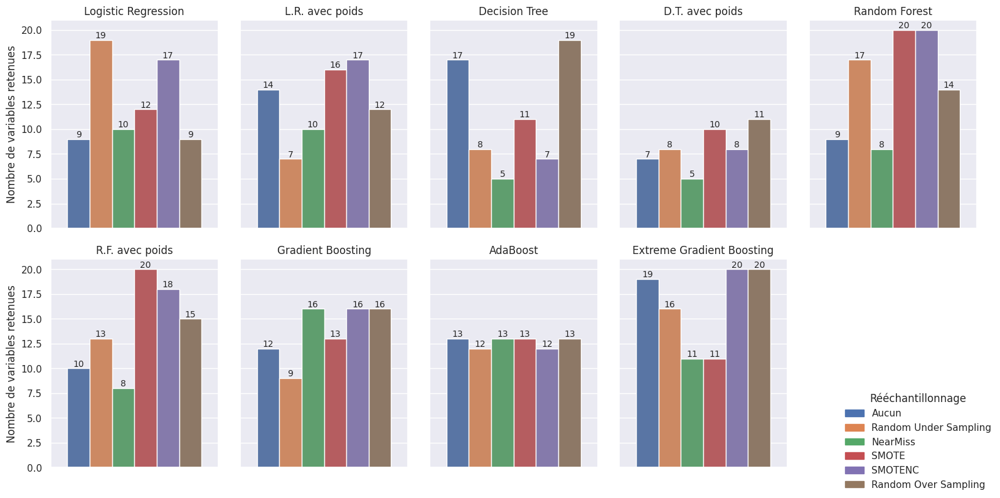

In [ ]:
import matplotlib.patches as mpatches # Pour spécifier les couleurs dans la légende globale, qui n'est liée à aucun objet de type ax.

modeles = resultats_df['Modèle'].value_counts().index.to_list()
techniques = resultats_df['Technique de rééchantillonnage'].value_counts().index.to_list()

fig, axes = plt.subplots(2, 5, figsize=(16, 8), sharey=True)

for model, ax in zip(modeles, axes.flatten()):
  mask = (resultats_df['Modèle'] == model)
  sns.barplot(data=resultats_df[mask], y='Nombre de variables retenues', hue = 'Technique de rééchantillonnage', ax=ax, legend=False)
  ax.set_title(model)

  for container in ax.containers:
    ax.bar_label(container, fontsize=10)

plt.tight_layout()

# On profite du dixième ax vide pour y mettre la légende. C'est une solution rapide dont l'esthétisme laisse à désirer.
# Voir le prochain graphique pour une meilleure solution.
fig.delaxes(axes[1,-1])
handles_colors = [mpatches.Patch(color=color) for color in sns.color_palette()[0:len(techniques)]]
fig.legend(labels=techniques, handles=handles_colors, title='Rééchantillonnage', loc='lower right', facecolor='white', edgecolor='white')

#### Visualisation des performances des modèles selon la technique de rééchantillonnage utilisée ainsi que selon les quatre métriques calculées sur la performance en test

In [ ]:
import matplotlib.patches as mpatches # Pour spécifier les couleurs dans la légende globale, qui n'est liée à aucun objet de type ax.

modeles = resultats_df['Modèle'].value_counts().index.to_list()
metriques = resultats_df.columns.to_list()[-4:]
techniques = resultats_df['Technique de rééchantillonnage'].value_counts().index.to_list()
cols_to_drop = ['Technique de rééchantillonnage', 'Nombre de variables retenues']

# Visualisation des performances des modèles selon les quatre métriques, pour une technique de rééchantillonnage donnée
fig, axes = plt.subplots(2, 3, figsize=(18, 8))
for tech, ax in zip(techniques, axes.flatten()):

  # Filtrage des lignes du df selon la technique de rééchantillonnage utilisée et suppression de colonnes inutiles.
  filtre = (resultats_df['Technique de rééchantillonnage'] == tech)
  resultats_df_filtre = resultats_df.loc[filtre].drop(columns=cols_to_drop)

  # Réorganisation du df. On prend les 4 colonnes contenant les métriques et on les intègre aux autres colonnes (duplication des lignes).
  resultats_df_long = resultats_df_filtre.melt(id_vars=['Modèle'], value_vars=metriques, var_name='Métrique', value_name='Résultat')

  # Génération du graphique
  sns.barplot(resultats_df_long, ax=ax, y='Résultat', x='Métrique', hue='Modèle', legend=False)
  ax.set_title("Rééchantillonnage : " + tech)

plt.tight_layout()

# Création d'espace à droite pour une légende globale et ajout de celle-ci. Couleurs ajoutées manuellement.
fig.subplots_adjust(right=0.85)
handles_colors = [mpatches.Patch(color=color) for color in sns.color_palette()[0:len(modeles)]]
fig.legend(labels=modeles, handles=handles_colors, title='Modèle', loc='center right', facecolor='white', edgecolor='white')

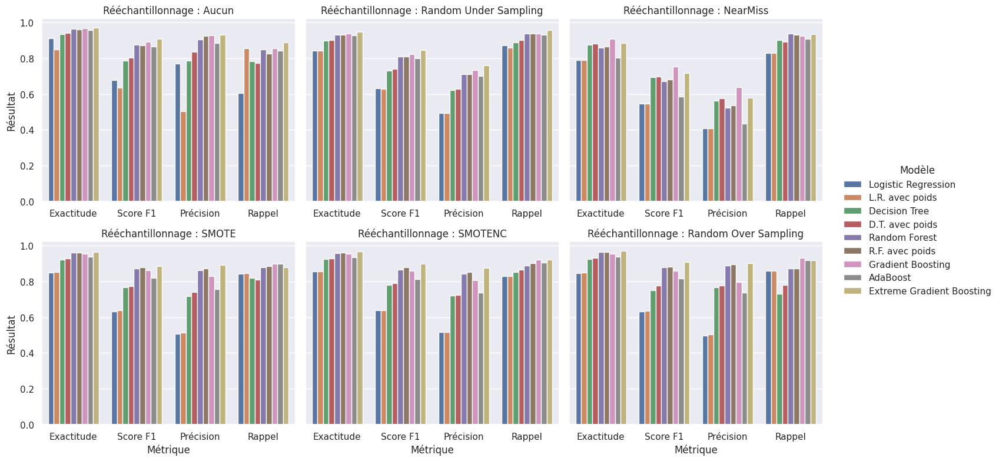

In [ ]:
# Autre approche pour afficher les mêmes graphiques que ci-haut.

temp = resultats_df.drop(columns=['Nombre de variables retenues'])
temp = temp.melt(id_vars=['Modèle', 'Technique de rééchantillonnage'], value_vars=temp.columns.to_list()[2:], var_name='Métrique', value_name='Résultat')

ax = sns.catplot(data=temp, kind='bar', y='Résultat', x='Métrique', hue='Modèle',
                 col='Technique de rééchantillonnage', col_wrap=3, height=4, aspect = 1.2, sharex=False)
ax.set_titles(col_template="Rééchantillonnage : {col_name}")
ax.tight_layout()

Quelques observations importantes découlant des graphiques :

- La plupart du temps, l'entraînement des modèles sans techniques de rééchantillonnage donne de très bonnes performances ; elles sont même parfois diminuées par l'emploi de ces techniques. En pratique, quand l'ensemble d'entraînement contient beaucoup d'exemples de la classe minoritaire (proportionnellement au débalancement observé), ce dernier n'est pas nécessairement un problème.

- Globalement, le modèle affichant la meilleure performance est XGBoost, suivi de près par le gradient boosting, un modèle assez similaire. Sauf quelques exceptions, les performances de XGBoost dépassent ou accotent celles de tous les autres modèles, et ce, peu importe la métrique considérée. La régularisation intégrée dans le développement des arbres, caractéristique principale distinguant XGBoost du gradient boosting, semble produire un effet bénéfique pour l'apprentissage. Cela dit, les autres modèles ensemblistes sont également assez performants.

- Généralement,  le sous-échantillonnage (aélatoire et NearMiss) augmente significativement la performance en rappel, mais diminue la précision du modèle de façon marquée (avec de meilleurs scores pour le sous-échantillonnage aléatoire). On ne peut donc pas conclure que les modèles possèdent un meilleur pouvoir discriminant. À la base, ces techniques sont contre-intuitives, pour ne pas dire contre-productives ; en effet, on diminue la taille du jeu de données (en l'occurence, de plusieurs milliers d'observations de la classe majoritaire).

- Du côté des techniques de sur-échantillonnage, on observe un effet similaire (précision diminuée, rappel augmenté) mais moins marqué. De plus, les techniques moins sophistiquées faisant uniquement intervenir le hasard performent généralement mieux.

- On a testé la régression logistique, l'arbre de décision et les forêts aléatoires selon leur paramètres par défauts, ainsi qu'avec des poids associés aux classes. Ces poids (option *class_weight*='balanced') interviennent directement dans la fonction de perte, en la pénalisant plus fortement en cas de mauvaise classification de la classe minoritaire. Parfois, cela permet d'améliorer les performances d'un modèle. Ici toutefois, pour les arbres de décision et les forêts aléatoires, les performances sont semblables. Dans le cas de la régression logistique, la différence entre les deux modèles est généralement très petite, et quand elle est grande, il n'y a pas de variante qui s'impose pour l'ensemble des métriques de performance.

### Optimisation des meilleurs modèles

En se fiant à ce qui précède, on choisit de garder deux modèles à optimiser : XGBoost sans aucune technique de rééchantillonnage, et XGBoost avec sur-échantillonnage aléatoire (Random OverSampling). On aurait également pu tenter d'optimiser le modèle du Gradient Boosting, car ses performances sont généralement assez proches de celles d'XGBoost.

#### Première optimisation

Rééchantillonnage : Aucun
Meilleur score (val. croisée) :  0.9746051621803747
Meilleurs paramètres :  {'subsample': 0.75, 'reg_lambda': 3, 'n_estimators': 500, 'min_split_loss': 0.5, 'max_depth': 4, 'learning_rate': 0.1, 'colsample_bytree': 0.7}


              precision    recall  f1-score   support

           0       0.98      0.99      0.98      2573
           1       0.94      0.89      0.91       466

    accuracy                           0.97      3039
   macro avg       0.96      0.94      0.95      3039
weighted avg       0.97      0.97      0.97      3039

Rééchantillonnage : Random Over Sampling
Meilleur score (val. croisée) :  0.9913953235918544
Meilleurs paramètres :  {'subsample': 0.9, 'reg_lambda': 0.5, 'n_estimators': 1500, 'min_split_loss': 0.2, 'max_depth': 8, 'learning_rate': 0.3, 'colsample_bytree': 0.5}


              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2573
           1       0.90      0.89      0.90       4

,Technique de rééchantillonnage,Exactitude,Score F1,Précision,Rappel
0,Aucun,0.974005,0.913091,0.936795,0.890558
1,Random Over Sampling,0.968740,0.897740,0.900648,0.894850


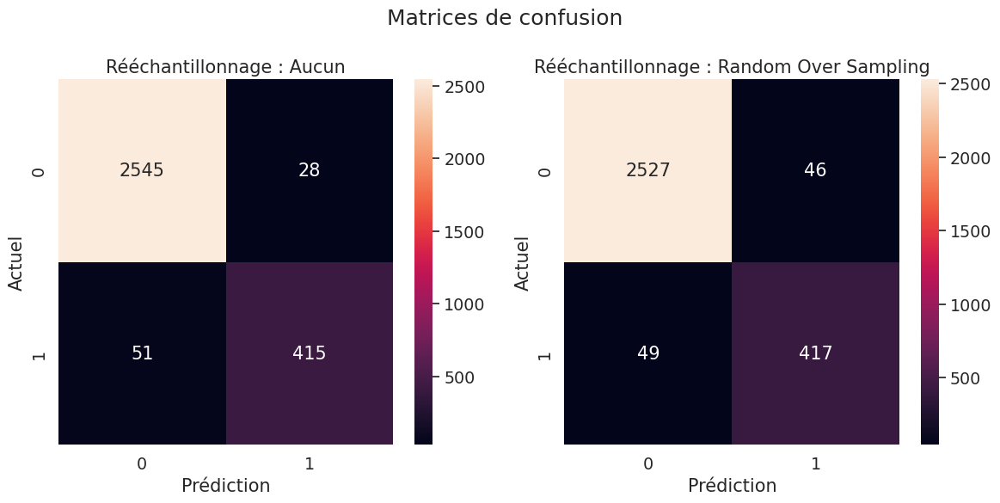

In [ ]:
%%time
# Initialisation du modèle et définition d'une grille d'hyperparamètres à tester.

modele = XGBClassifier()

grille_hp = {
    'n_estimators': [100, 200, 500, 1000, 1500],
    'max_depth': [4, 5, 6, 7, 8],
    'learning_rate' : [0.05, 0.1, 0.3, 0.5, 0.7],
    'reg_lambda' : [0.05, 0.1, 0.5, 1, 2, 3],
    'min_split_loss' : [0, 0.2, 0.4, 0.5, 0.6],
    'subsample' : [0.7, 0.75, 0.8, 0.9, 1.0],
    'colsample_bytree' : [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
}

# Création d'un dictionnaire contenant les techniques de rééchantillonnage qui seront testées
resamplers = {'Aucun': None,
              'Random Over Sampling': RandomOverSampler()}

resultats_opt = []
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Standardisation des données. Le prétraitement et les classificateurs seront imbriqués dans un pipeline pour la deuxième phase d'optimisation.
scaler = StandardScaler()
X_train_s = scaler.fit_transform(X_train)
X_test_s = scaler.transform(X_test)


# On itère sur chaque technique de rééchantillonnage (resampler)
for (resampler_name, resampler), ax in zip(resamplers.items(), axes.flatten()):
  # Rééchantillonnage de l'ensemble d'entraînement
  if resampler == None:
    X_train_resampled, y_train_resampled = X_train_s, y_train
  else:
    X_train_resampled, y_train_resampled = resampler.fit_resample(X_train_s, y_train)

  # Sélection de variables avec la classe RFECV (Recursive Feature Elimination with CV) de sk-learn
  selector = RFECV(modele, step=1, min_features_to_select=5, cv=5)
  selector.fit(X_train_resampled, y_train_resampled)
  X_train_selected = selector.transform(X_train_resampled)
  X_test_selected = selector.transform(X_test_s)

  # Recherche aléatoire dans la grille d'hyperparamètres.
  # D'un point de vue probabiliste, 1 000 itérations aléatoires est plus que suffisant pour s'assurer d'avoir au moins un essai tombant proche de la solution optimale.
  rs = RandomizedSearchCV(modele, param_distributions=grille_hp, n_iter=1000, cv=5, random_state=7)
  rs.fit(X_train_selected , y_train_resampled)

  print("Rééchantillonnage : " + resampler_name + "\n" + "Meilleur score (val. croisée) : ", rs.best_score_)
  print("Meilleurs paramètres : ", rs.best_params_)
  print("\n")

  # On effectue les prédictions sur l'ensemble de test à l'aide de la meilleure combinaison d'hyperparamètres et on affiche un rapport de classification
  y_pred = rs.best_estimator_.predict(X_test_selected)
  print(classification_report(y_test, y_pred))

  # On évalue la performance du modèle sur l'ensemble de test à l'aide de plusieurs métriques
  acc = accuracy_score(y_test, y_pred)
  f1 = f1_score(y_test, y_pred)
  precision = precision_score(y_test, y_pred)
  recall = recall_score(y_test, y_pred)

  # Enregistrement des résultats par technique de rééchantillonnage dans une liste de dictionnaires
  resultats_opt.append({'Technique de rééchantillonnage': resampler_name,
                    'Exactitude': acc,
                    'Score F1': f1,
                    'Précision': precision,
                    'Rappel': recall})

  # Création d'une matrice de confusion par technique de rééchantillonnage avec les meilleurs paramètres.
  cm = confusion_matrix(y_test, y_pred)
  sns.heatmap(cm, annot=True, fmt='g', ax=ax)
  ax.set_xlabel('Prédiction')
  ax.set_ylabel('Actuel')
  ax.set_title('Rééchantillonnage : ' + resampler_name)

plt.suptitle('Matrices de confusion')
plt.tight_layout()

# On convertit les résultats en un DataFrame
resultats_opt = pd.DataFrame(resultats_opt)

# Enregistrement dans un fichier .csv
dir_out = '/content/drive/MyDrive/Colab Notebooks/Projets/CreditCardChurn/'
resultats_opt.to_csv(dir_out + 'Résultats_opt_rs.csv', index=False)

resultats_opt

On constate que le modèle sans rééchantillonnage affiche la meilleure exactitude et la meilleure précision, tandis que celui avec sur-échantillonnage aléatoire affiche le meilleur rappel. Notons toutefois que pour ce dernier, il y a moins de faux négatifs, mais plus de faux positifs : cela se reflète dans les scores F1, où le modèle sans rééchantillonnage l'emporte. On peut tenter d'optimiser de nouveau quelques paramètres, mais le gain est habituellement de plus en plus petit.

#### Deuxième optimisation

Affichons les performances actuelles sur l'ensemble de test de nos deux modèles. Les paramètres ajustés proviennent de la première optimisation, et permettent actuellement la meilleure classification de données encore non observées par les modèles. Ici, on met à profit les pipelines des modules scikit-learn et imb-learn.

              precision    recall  f1-score   support

           0   0.981867  0.989118  0.985479      2573
           1   0.937360  0.899142  0.917853       466

    accuracy                       0.975321      3039
   macro avg   0.959614  0.944130  0.951666      3039
weighted avg   0.975043  0.975321  0.975109      3039



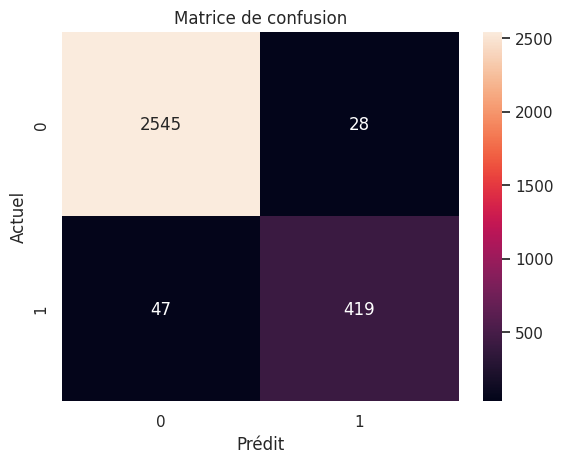

In [ ]:
# Pour le modèle sans rééchantillonnage
scaler = StandardScaler()
selector = RFECV(XGBClassifier(), step=1, min_features_to_select=5, cv=5)
xgb_aucun = XGBClassifier(n_estimators=1000, subsample=0.75, reg_lambda=0.5, min_split_loss=0.5, max_depth=6, learning_rate=0.05, colsample_bytree=0.7)

pipeline_aucun = make_pipeline(scaler, selector, xgb_aucun)
pipeline_aucun.fit(X_train, y_train)

y_pred = pipeline_aucun.predict(X_test)

print(classification_report(y_test, y_pred, digits=6))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='g')
plt.xlabel('Prédit')
plt.ylabel('Actuel')
plt.title('Matrice de confusion')
plt.show()

              precision    recall  f1-score   support

           0   0.984484  0.986397  0.985440      2573
           1   0.924078  0.914163  0.919094       466

    accuracy                       0.975321      3039
   macro avg   0.954281  0.950280  0.952267      3039
weighted avg   0.975221  0.975321  0.975266      3039



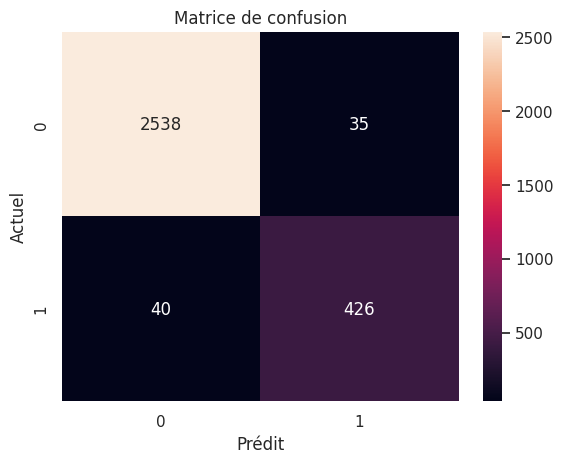

In [ ]:
# Avec sur-échantillonnage aléatoire
scaler = StandardScaler()
resampler = RandomOverSampler(random_state=34)
selector = RFECV(XGBClassifier(), step=1, min_features_to_select=5, cv=5)
xgb_ros = XGBClassifier(n_estimators=1500, subsample=0.9, reg_lambda=0.05, min_split_loss=0, max_depth=5, learning_rate=0.05, colsample_bytree=0.6)

pipeline_ros = make_pipeline(scaler, resampler, selector, xgb_ros)
pipeline_ros.fit(X_train, y_train)

y_pred = pipeline_ros.predict(X_test)

print(classification_report(y_test, y_pred, digits=6))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='g')
plt.xlabel('Prédit')
plt.ylabel('Actuel')
plt.title('Matrice de confusion')
plt.show()

On va tenter d'optimiser à nouveau nos modèles en raffinant notre recherche de certains hyperparamètres (toujours en validation croisée effectuée sur l'ensemble d'entraînement).

On débute en effectuant, pour chaque modèle, les étapes de standardisation, de rééchantillonnage s'il y a lieu et de sélection des variables. On cherche à réduire au minimum le temps de calcul requis pour la seconde recherche des hyperparamètres.

In [ ]:
scaler = StandardScaler()
X_train_s = scaler.fit_transform(X_train)
X_test_s = scaler.transform(X_test)

In [ ]:
# Aucun rééchantillonnage
selector = RFECV(XGBClassifier(), step=1, min_features_to_select=5, cv=5)
selector.fit(X_train_s, y_train)
X_train_sel_aucun = selector.transform(X_train_s)
X_test_sel_aucun = selector.transform(X_test_s)

In [ ]:
%%time
params_aucun = {
    'n_estimators': np.arange(1000, 1500, 100),
    'learning_rate' : np.arange(0.01, 0.08, 0.01),
    'reg_lambda' : np.arange(0.4, 0.5, 0.01)
}

xgb_aucun = XGBClassifier(n_estimators=1000, subsample=0.75, reg_lambda=0.5, min_split_loss=0.5, max_depth=6, learning_rate=0.05, colsample_bytree=0.7)

gs_aucun = GridSearchCV(xgb_aucun, param_grid=params_aucun, n_jobs=1, cv=5)
gs_aucun.fit(X_train_sel_aucun , y_train)

print("Meilleur score (val. croisée) : ", gs_aucun.best_score_)
print("Meilleurs paramètres : ", gs_aucun.best_params_)
print("Performance détaillée sur l'ensemble de test :" + "\n")

# On effectue les prédictions sur l'ensemble de test à l'aide de la meilleure combinaison d'hyperparamètres et on affiche un rapport de classification
y_pred_aucun = gs_aucun.predict(X_test_sel_aucun)
print(classification_report(y_test, y_pred_aucun, digits=6))

Meilleur score (val. croisée) :  0.9751695361483019

Meilleurs paramètres :  {'learning_rate': 0.05, 'n_estimators': 1400, 'reg_lambda': 0.4800000000000001}

Performance détaillée sur l'ensemble de test :



              precision    recall  f1-score   support



           0   0.981103  0.988729  0.984901      2573

           1   0.934978  0.894850  0.914474       466



    accuracy                       0.974334      3039

   macro avg   0.958040  0.941789  0.949687      3039

weighted avg   0.974030  0.974334  0.974102      3039



CPU times: user 1h 27min 9s, sys: 44.4 s, total: 1h 27min 53s

Wall time: 56min 30s


In [ ]:
# Avec sur-échantillonnage aléatoire
resampler = RandomOverSampler(random_state=34) # ROS
X_train_resampled, y_train_resampled = resampler.fit_resample(X_train_s, y_train)
selector = RFECV(XGBClassifier(), step=1, min_features_to_select=5, cv=5)
selector.fit(X_train_resampled, y_train_resampled)
X_train_sel_ros = selector.transform(X_train_resampled)
X_test_sel_ros = selector.transform(X_test_s)

In [ ]:
%%time
params_ros = {
    'n_estimators': np.arange(1200, 1800, 100),
    'learning_rate' : np.arange(0.01, 0.09, 0.01),
    'reg_lambda' : np.arange(0.01, 0.09, 0.01)
}

xgb_ros = XGBClassifier(n_estimators=1500, subsample=0.9, reg_lambda=0.05, min_split_loss=0, max_depth=5, learning_rate=0.05, colsample_bytree=0.6)

gs_ros = GridSearchCV(xgb_ros, param_grid=params_ros, n_jobs=1, cv=5)
gs_ros.fit(X_train_sel_ros , y_train_resampled)

print("Meilleur score (val. croisée) : ", gs_ros.best_score_)
print("Meilleurs paramètres : ", gs_ros.best_params_)
print("Performance détaillée sur l'ensemble de test :" + "\n")

# On effectue les prédictions sur l'ensemble de test à l'aide de la meilleure combinaison d'hyperparamètres et on affiche un rapport de classification
y_pred_ros = gs_ros.predict(X_test_sel_ros)
print(classification_report(y_test, y_pred_ros, digits=6))

Meilleur score (val. croisée) :  0.9914794626348261

Meilleurs paramètres :  {'learning_rate': 0.060000000000000005, 'n_estimators': 1200, 'reg_lambda': 0.01}

Performance détaillée sur l'ensemble de test :



              precision    recall  f1-score   support



           0   0.984436  0.983288  0.983862      2573

           1   0.908316  0.914163  0.911230       466



    accuracy                       0.972688      3039

   macro avg   0.946376  0.948726  0.947546      3039

weighted avg   0.972764  0.972688  0.972724      3039



CPU times: user 2h 29min 53s, sys: 1min 12s, total: 2h 31min 6s

Wall time: 1h 31min 57s


Dans les deux cas, bien que la seconde optimisation à l'aide d'une recherche exhaustive sur grille a permis d'augmenter la performance en validation croisée, ces (faibles) gains n'ont eu aucun impact (positif) sur la performance en test. Les hyperparamètres actuels sont vraisemblablement proches de la solution optimale.

En fait, les résultats obtenus par nos deux modèles avant la deuxième tentative d'optimisation sont très bons, avec une exactitude de 97.5%. En comparaison, un modèle inutile classant systématiquement toutes les observations dans la classe majoritaire aurait une exactitude de 83%. Le modèle sans rééchantillonnage est celui avec le moins de faux positifs (précision à 93.7%), tandis que le modèle avec RandomOverSampler est celui avec le moins de faux négatifs (rappel à 91.4%). Cela est cohérent avec l'effet attendu (mais pas toujours obtenu) des techniques de rééchantillonnage : une meilleure compréhension de la classe minoritaire.

### Comparaison des modèles (courbes ROC et précision-rappel)

À des fins de comparaison, on peut générer deux types de graphiques : la courbe ROC (Receiver Operating Caracteristic) et la courbe de Précision-Rappel. La première s'obtient en traçant le taux de vrais positifs en fonction du taux de faux positifs, selon différents seuils de classification. La seconde s'obtient en calculant la précision et le rappel pour différents seuils de classification du modèle étudié.

#### Comparaison des modèles à l'aide des courbes ROC

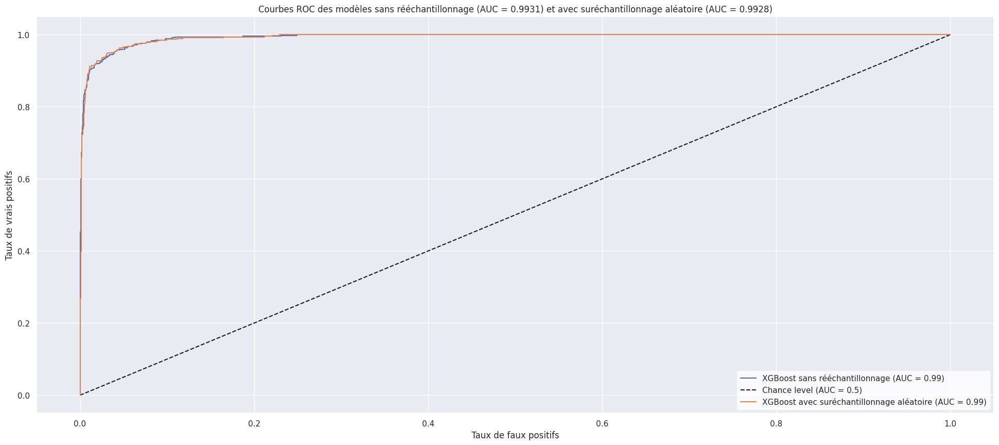

In [ ]:
# Visualisation des courbes ROC de nos deux modèles.
# Il faut exécuter les deux premières cellules de code de la sous-section "Deuxième optimisation" au préalable.

# Calcul des probabilités d'appartenance à la classe d'intérêt
y_prob_aucun = pipeline_aucun.predict_proba(X_test)[:,1]
y_prob_ros = pipeline_ros.predict_proba(X_test)[:,1]

# Calcul des aires sous la courbe ROC pour chaque modèle
auc_a = roc_auc_score(y_test, y_prob_aucun)
auc_r = roc_auc_score(y_test, y_prob_ros)

# Visualisation des courbes ROC
plt.figure(figsize=(24, 10))
ax = plt.gca()
#ax.set_facecolor("white")

# La classe RocCurveDisplay ne permet pas de modifier le nombre de décimales de la métrique AUC dans la légende.
# Par conséquent, on inclut également les deux valeurs dans le titre, avec la précision voulue.
RocCurveDisplay.from_predictions(y_test, y_prob_aucun, name="XGBoost sans rééchantillonnage", ax=ax, plot_chance_level=True)
RocCurveDisplay.from_predictions(y_test, y_prob_ros, name="XGBoost avec suréchantillonnage aléatoire", ax=ax)

plt.legend(facecolor="white", edgecolor="white")
plt.xlabel('Taux de faux positifs')
plt.ylabel('Taux de vrais positifs')
plt.title(f"Courbes ROC des modèles sans rééchantillonnage (AUC = {auc_a:.4f}) et avec suréchantillonnage aléatoire (AUC = {auc_r:.4f})")
plt.show()

Tel qu'attendu, les deux modèles performent de manière excellente. Les courbes ROC, étant très près du coin supérieur gauche, témoignent de cette performance, tout comme les scores d'aire sous la courbe qui sont de 0.9931 et 0.9928. Autrement dit, les modèles affichent un taux de vrais positifs élevé, tout en gardant un taux de faux positifs très bas. On conclut que les deux modèles ont une excellente capacité à discriminer entre les classes négative et positive, qui correspondent respectivement aux clients actuels et aux clients perdus.

#### Comparaison des modèles à l'aide des courbes de précision-rappel

La précision réfère à la capacité d'un modèle à ne pas classer comme positives les observations qui sont négatives. La formule est donc

$$\mathrm{précision} = \frac{\mathrm{tp}}{\mathrm{tp + fp}}$$

où tp correspond au nombre d'observations réellement positives classées comme telles et fp correspond au nombre de faux positifs, c'est-à-dire les observations négatives incorrectement classées comme étant positives. Il s'agit donc du pourcentage d'observations réellement positives parmi toutes les observations classées comme étant positives. Ainsi, moins il y a de faux positifs, meilleure est la précision.

Quant au rappel, il réfère à la capacité d'un modèle à *identifier* quelles observations sont positives. Par conséquent, on l'obtient en calculant

$$\mathrm{rappel} = \frac{\mathrm{tp}}{\mathrm{tp + fn}}$$

où tp correspond au nombre d'observations réellement positives classées comme telles et fn correspond au nombre de faux négatifs, c'est-à-dire les observations positives incorrectement classées comme étant négatives. Il s'agit donc du pourcentage d'observations positives identifiées parmi l'ensemble des observations réellement positives. Ainsi, moins il y a de faux négatifs, meilleur est le rappel.

Il découle des définitions précédentes qu'on cherche souvent à trouver un compromis entre une précision élevée et un rappel élevé. À cet effet, le *score F1* est une métrique pouvant être intéressante, puisqu'on l'obtient en calculant la moyenne harmonique de la précision et du rappel :

$$\mathrm{score\space F1} = \frac{2\times\mathrm{précision}\times\mathrm{rappel}}{\mathrm{précision} + \mathrm{rappel}}.$$

Bref, en changeant le seuil servant à distinguer les classes positive et négative d'un classificateur, on peut observer comment varient la précision et le rappel du modèle. La courbe de précision-rappel est particulièrement utile dans le cas où les classes sont débalancées.

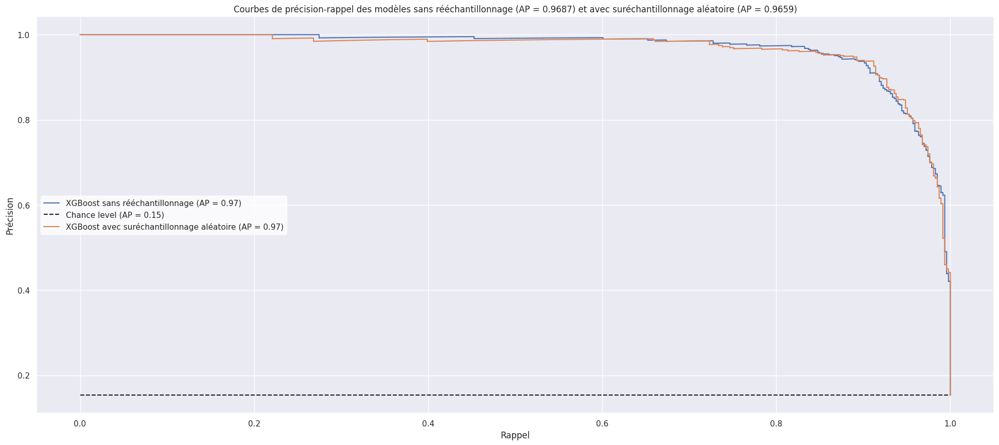

In [ ]:
# Visualisation des courbes précision-rappel de nos deux modèles.
# Il faut exécuter les deux premières cellules de code de la sous-section "Deuxième optimisation" au préalable.

# Calcul des probabilités d'appartenance à la classe d'intérêt
y_prob_aucun = pipeline_aucun.predict_proba(X_test)[:,1]
y_prob_ros = pipeline_ros.predict_proba(X_test)[:,1]

# Calcul du score de précision moyen (average precision score, dénoté AP dans sklearn) pour chaque modèle.
# C'est un substitut à l'aire sous la courbe (AUC) qui donne une évaluation plus fiable de la performance d'un classificateur.
# Dans le contexte d'une courbe de précision-rappel, la métrique AUC est parfois un peu trop "optimiste" (ce n'est toutefois pas le cas ici).
ap_a = average_precision_score(y_test, y_prob_aucun)
ap_r = average_precision_score(y_test, y_prob_ros)

# Calculs pour l'aire sous la courbe (AUC). Dans le cas présent, les résultats sont les mêmes que l'AP.
#pre_a, rap_a, _ = precision_recall_curve(y_test, y_prob_aucun)
#pre_r, rap_r, _ = precision_recall_curve(y_test, y_prob_ros)
#ap_a = auc(rap_a, pre_a)
#ap_r = auc(rap_r, pre_r)

# Visualisation des courbes de précision-rappel
plt.figure(figsize=(24, 10), frameon=True)
ax = plt.gca()
#ax.set_facecolor("white")

# La classe PrecisionRecallDisplay ne permet pas de modifier le nombre de décimales de la métrique AP dans la légende.
# Par conséquent, on inclut également les deux valeurs dans le titre, avec la précision voulue.
PrecisionRecallDisplay.from_predictions(y_test, y_prob_aucun, name="XGBoost sans rééchantillonnage", ax=ax, plot_chance_level=True)
PrecisionRecallDisplay.from_predictions(y_test, y_prob_ros, name="XGBoost avec suréchantillonnage aléatoire", ax=ax)

plt.legend(facecolor="white", edgecolor="white")
plt.xlabel('Rappel')
plt.ylabel('Précision')
plt.title(f"Courbes de précision-rappel des modèles sans rééchantillonnage (AP = {ap_a:.4f}) et avec suréchantillonnage aléatoire (AP = {ap_r:.4f})")
plt.show()

Un modèle affichant une performance parfaite aurait une précision et un rappel égaux à 100%, ce qui se traduit par une courbe P-R passant par le coin supérieur droit (coordonnées (1, 1)) du graphique. À l'inverse, un modèle qui classifie systématiquement toutes les observations comme étant positives aurait un rappel de 100%, mais une précision égale au pourcentage réel d'observations positives dans le jeu de données. Ce point se situe en bas à droite du graphique, à l'intersection des courbes avec la ligne pointillée.

On voit ici qu'encore une fois, les deux modèles affichent une très bonne performance (comme en témoignent leur courbe et leur coefficient AP près de 1) et qu'ils sont difficiles à départager. Néanmoins, l'aire sous la courbe ROC et l'*average precision score* (AP) indiquent tous les deux que le modèle sans rééchantillonnage performe légèrement mieux. En pratique, il serait possiblement approprié d'utiliser l'un ou l'autre ; cependant, en fonction des objectifs derrière le développement d'un modèle d'apprentissage automatique, le rappel légèrement supérieur du modèle avec suréchantillonnage aléatoire pourrait être un facteur faisant pencher la balance en sa faveur, le cas échéant.

**Note** : on aurait pu sélectionner le rappel comme étant la métrique d'intérêt à optimiser à chaque étape du processus d'optimisation élaboré précédemment. Cela aurait pu conduire à une autre conclusion, dépendamment de l'impact sur les performances des modèles et des critères utilisés pour les départager.

De plus, comme nos modèles retournent pour chaque observation une probabilité que celle-ci appartienne à la classe minoritaire, on pourrait aussi tenter d'ajuster le seuil de classification des modèles, soit la valeur à partir de laquelle une observation est classifiée comme étant un client perdu, afin d'optimiser les performances. Cela requiert toutefois que les modèles soient bien calibrés, ce qui sera investigué à la [partie III de ce Notebook](#scrollTo=QWxODIUDova9&line=3&uniqifier=1).

### Importance relative des variables explicatives

Pour finir cette partie, on souhaite déterminer quelles variables ont été retenues pour nos deux modèles via le procédé RFECV (recursive feature elimination), ainsi que leur importance relative dans les modèles optimisés quant à la prédiction du statut d'un client.

**Note** : Comme le processus d'élimination successive des variables avait lieu après le rééchantillonnage, les variables retenues pour chacun des modèles sont différentes (voir à cet effet le DataFrame des résultats en question [ici](#scrollTo=eZQtU_UcHXCD)).

#### Variables sélectionnées par le procédé RFECV (classificateur XGBoost par défaut)

Affichons les variables retirées lors du processus d'élimination récursive.

In [ ]:
# Il faut exécuter les deux premières cellules de code de la sous-section "Deuxième optimisation" au préalable.
vars_retenues_aucun = list(pipeline_aucun.named_steps['rfecv'].get_feature_names_out(Xcol))
[x for x in Xcol if x not in vars_retenues_aucun]

['Card_Category']

In [ ]:
# Il faut exécuter les deux premières cellules de code de la sous-section "Deuxième optimisation" au préalable.
vars_retenues_ros = list(pipeline_ros.named_steps['rfecv'].get_feature_names_out(Xcol))
[x for x in Xcol if x not in vars_retenues_ros]

['Dependent_count',
 'Education_Level',
 'Income_Category',
 'Marital_Status_Divorced',
 'Marital_Status_Single']

Les deux cellules de code ci-dessus montrent bien que comme nous avions anticipé, les variables qualitatives ne jouent pas un grand rôle dans la désertion de la clientèle. En effet, pour les deux classificateurs, à l'exception de la variable Dependent_count, toutes les variables retirées à l'étape du processus RFECV sont qualitatives.

#### Importance relative des variables dans les modèles optimisés

In [ ]:
# Il faut exécuter les deux premières cellules de code de la sous-section "Deuxième optimisation" au préalable.
clf_aucun = list(pipeline_aucun.named_steps.keys())[-1]
clf_ros = list(pipeline_ros.named_steps.keys())[-1]

In [ ]:
# On récupère la liste des variables retenues lors de l'étape rfecv
vars_retenues_aucun = list(pipeline_aucun.named_steps['rfecv'].get_feature_names_out(Xcol))
vars_retenues_ros = list(pipeline_ros.named_steps['rfecv'].get_feature_names_out(Xcol))

# On récupère la liste des importances relatives de chaque variable pour chaque modèle optimisé
importances_aucun = list(pipeline_aucun.named_steps[clf_aucun].feature_importances_)
importances_ros = list(pipeline_ros.named_steps[clf_ros].feature_importances_)

# On associe le nom de chaque variable à son importance
feature_importances_aucun = [(feature, round(importance, 2)) for feature, importance in zip(vars_retenues_aucun, importances_aucun)]
feature_importances_ros = [(feature, round(importance, 2)) for feature, importance in zip(vars_retenues_ros, importances_ros)]

# Ordonnancement des valeurs d'importance (key = lambda variable : variable[1] pour spécifier selon la 2e colonne) en ordre décroissant (reverse = True)
feature_importances_aucun = sorted(feature_importances_aucun, key=lambda variable: variable[1], reverse=True)
feature_importances_ros = sorted(feature_importances_ros, key=lambda variable: variable[1], reverse=True)

# Création d'un dataframe pour faciliter la visualisation par Seaborn
df_aucun = pd.DataFrame(feature_importances_aucun, columns=['Variable', 'Importance relative'])
df_ros = pd.DataFrame(feature_importances_ros, columns=['Variable', 'Importance relative'])

# On aurait pu sauter la création d'une liste de tuples en générant directement un DataFrame dont le contenu est spécifié a l'aide
# d'un dict{} (une clé par colonne), puis en effectuant le triage des lignes selon la colonne des importances (méthode pd.dataframe.sort_values).

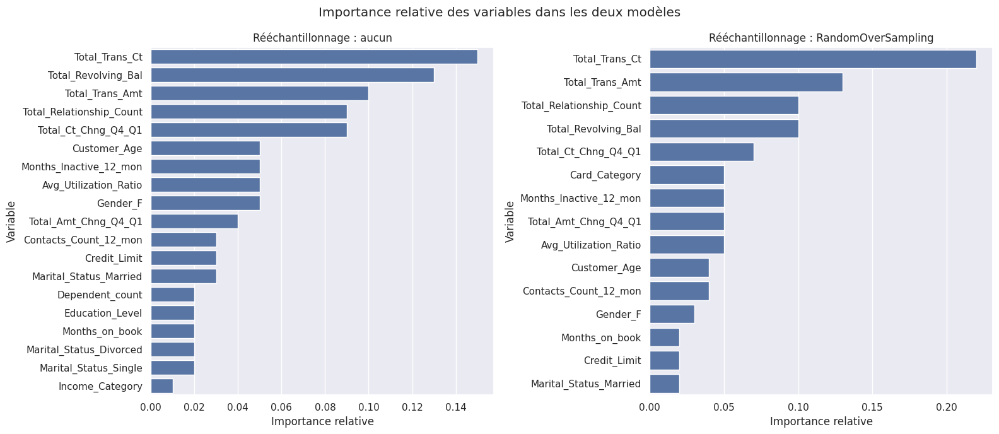

In [ ]:
# Visualisation des importances relatives dans un graphique de type barplot
plt.subplots(1, 2, figsize=(16, 7))

plt.subplot(121, title='Rééchantillonnage : aucun')
sns.barplot(data=df_aucun, x='Importance relative', y='Variable', orient='h')

plt.subplot(122, title='Rééchantillonnage : RandomOverSampling')
sns.barplot(data=df_ros, x='Importance relative', y='Variable', orient='h')

plt.suptitle('Importance relative des variables dans les deux modèles')
plt.tight_layout()

On remarque que :
- Les variables quantitatives sont beaucoup plus importantes que les variables qualitatives, ce qui vient renforcer nos constats antérieurs.

- Les cinq variables les plus importantes sont les mêmes pour les deux modèles, mais leur importance relative diffère et elles ne sont pas toutes dans le même ordre. Par exemple, le modèle avec suréchantillonnage aléatoire accorde moins d'importance à la balance totale renouvelée que le modèle sans rééchantillonnage.

- Si on se limite aux variables présentes dans les deux modèles, on peut voir que l'ordre général est somme toute similaire (à l'exception de quelques variables comme l'âge et le sexe de l'individu, la durée du lien avec la banque (Months_on_book) et son ratio moyen d'utilisation du crédit).



## Partie III : prédiction du risque et calibration des probabilités

Dans les parties I et II, les modèles ont été entraînés, comparés, optimisés et analysés à l'aide de différentes métriques comme le rappel, la précision, l'aire sous la courbe ROC et l'exactitude. Puisque ces métriques sont calculées en se basant sur la classification des observations de l'ensemble de test, le modèle sélectionné pourrait servir dans un contexte où le pipeline de données effectuerait la classification (le client va rester VS le client va résilier) de façon entièrement automatique.

Or, voici quelques aspects qui mériteraient être approfondis, le cas échéant :

- **Coût des faux positifs VS coût des faux négatifs.** Pour la banque, le coût rattaché à une classification incorrecte est-il le même, indépendamment du véritable statut du client ? Autrement dit, la banque considère-t-elle qu'un client classifié à tort comme étant sur le point de résilier son contrat entraîne les mêmes conséquences qu'un client incorrectement prédit comme allant rester ? Il y a de fortes chances que cette dernière possibilité soit plus néfaste que l'autre aux yeux des décideurs. Dans un tel cas, on pourrait  ajuster le seuil de classification du modèle afin de refléter adéquatement la balance des coûts des deux types d'erreurs, plutôt que de le laisser à 50% (le pourcentage par défaut).

- **Classification vs prédiction du risque.** Selon les objectifs établis par la banque, identifier les clients les plus à risque de résilier leur contrat de carte de crédit n'exige pas de classifier systématiquement chaque client selon une règle dichotomique. Il est habituellement plus approprié d'évaluer, pour chaque client, la **probabilité** (ou risque) que celui-ci résilie son contrat en développant un *modèle de prédiction du risque*. On ne s'intéresse alors plus à la décision du classificateur, mais bien aux probabilités individuelles calculées par le modèle pour chaque observation.
  
  Un avantage est que cette approche concorde mieux avec les contraintes inhérentes à un projet, comme les ressources humaines et le budget qui sont limités. Par exemple, si la banque peut offrir des avantages supplémentaires à $n$ clients afin de les inciter à utiliser davantage leur carte de crédit, elle aura tout intérêt à cibler les $n$ clients identifiés par le modèle comme étant les plus à risque (probabilité près de 1) de résilier leur carte afin d'optimiser son retour sur investissement, puisque notre analyse a montré que les clients utilisant moins leur carte étaient plus susceptibles de résilier leur contrat.

- **Calibration du modèle.** De manière générale, la calibration d'un modèle réfère à sa capacité, pour chaque observation, à estimer des probabilités d'appartenance aux classes étudiées qui sont proches des vraies probabilités. Avec un classificateur dichotomique, il est possible d'obtenir de très bonnes performances au regard de plusieurs métriques comme l'exactitude et le rappel, même s'il est mal calibré. Dépendamment de l'utilisation prévue du classificateur, ce défaut peut être mis de côté si le classificateur en question performe de manière excellente.

  En revanche, pour un modèle de prédiction du risque comme celui décrit au paragraphe précédent, il est crucial que les probabilités calculées par le modèle soient fiables puisque ce sont elles qui guident l'utilisateur au moment de prendre sa décision. Il devient alors important de s'assurer que le modèle est bien calibré, ou d'y remédier, le cas échéant.
  
Il existe plus d'une façon d'évaluer la calibration d'un modèle et de l'améliorer au besoin. Éventuellement, l'approche avec un modèle de prédiction du risque, jumelée avec certaines notions de calibration, sera ajoutée à cette partie du Notebook. Pensons notamment au score de Brier et à sa décomposition en trois volets, ainsi qu'à la régression isotonique visant à corriger les problèmes de calibration.